In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import utils
from sktime.transformations.series.boxcox import BoxCoxTransformer
from statsmodels.graphics import tsaplots
from statsmodels.tsa.stattools import acf, pacf

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
%cd ..
%ls ./data

/home/den/dev/git/time-series-analysis/final-task
shop_sales.csv  shop_sales_dates.csv  shop_sales_prices.csv


# EDA

## Общий

In [ ]:
sales = pd.read_csv("./data/shop_sales.csv")
dates = pd.read_csv("./data/shop_sales_dates.csv")
prices = pd.read_csv("./data/shop_sales_prices.csv")

In [ ]:
utils.pretty_info(sales, "sales")
utils.pretty_info(dates, "dates")
utils.pretty_info(prices, "prices")

sales:
  Columns: ['item_id', 'store_id', 'date_id', 'cnt']
  Rows: 81855
--------------------------------------------------
dates:
  Columns: ['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'date_id', 'CASHBACK_STORE_1', 'CASHBACK_STORE_2', 'CASHBACK_STORE_3']
  Rows: 1819
--------------------------------------------------
prices:
  Columns: ['store_id', 'item_id', 'wm_yr_wk', 'sell_price']
  Rows: 11141
--------------------------------------------------


Далее буду работать с магазином `store_id = STORE_1`.

In [ ]:
sales = sales[sales["store_id"] == "STORE_1"].drop(columns=["store_id"])
dates.drop(columns=["CASHBACK_STORE_2", "CASHBACK_STORE_3"], inplace=True)
prices = prices[prices["store_id"] == "STORE_1"].drop(columns=["store_id"])

In [ ]:
utils.pretty_info(sales, "sales")
utils.pretty_info(dates, "dates")
utils.pretty_info(prices, "prices")

sales:
  Columns: ['item_id', 'date_id', 'cnt']
  Rows: 27285
--------------------------------------------------
dates:
  Columns: ['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'date_id', 'CASHBACK_STORE_1']
  Rows: 1819
--------------------------------------------------
prices:
  Columns: ['item_id', 'wm_yr_wk', 'sell_price']
  Rows: 3873
--------------------------------------------------


### Анализ sales

In [ ]:
unique_items = sales["item_id"].unique()
n_items = len(unique_items)
print(f"Number of unique items: {n_items}")

Number of unique items: 15


In [ ]:
for item in unique_items:
    item_sales = sales[sales["item_id"] == item]
    first_date = item_sales["date_id"].min()
    last_date = item_sales["date_id"].max()
    print(f"{item}: first date_id = {first_date}, last date_id = {last_date}")

STORE_1_064: first date_id = 1, last date_id = 1819
STORE_1_065: first date_id = 1, last date_id = 1819
STORE_1_325: first date_id = 1, last date_id = 1819
STORE_1_376: first date_id = 1, last date_id = 1819
STORE_1_090: first date_id = 1, last date_id = 1819
STORE_1_252: first date_id = 1, last date_id = 1819
STORE_1_339: first date_id = 1, last date_id = 1819
STORE_1_546: first date_id = 1, last date_id = 1819
STORE_1_547: first date_id = 1, last date_id = 1819
STORE_1_555: first date_id = 1, last date_id = 1819
STORE_1_584: first date_id = 1, last date_id = 1819
STORE_1_586: first date_id = 1, last date_id = 1819
STORE_1_587: first date_id = 1, last date_id = 1819
STORE_1_714: first date_id = 1, last date_id = 1819
STORE_1_727: first date_id = 1, last date_id = 1819


У нас по-дневные данные продаж в `sales`.  
Для всех товаров временной диапазон продаж одинаков - это хорошо. 

In [ ]:
n_days = sales["date_id"].max() - sales["date_id"].min() + 1
print(f"Number of days in sales data: {n_days}")
n_weeks = n_days / 7
n_months = n_days / 30
n_quarters = n_days / (4 * 30)
n_years = n_days / 365
print(f"Number of weeks in sales data: {n_weeks}")
print(f"Number of months in sales data: {n_months}")
print(f"Number of quarters in sales data: {n_quarters}")
print(f"Number of years in sales data: {n_years}")

Number of days in sales data: 1819
Number of weeks in sales data: 259.85714285714283
Number of months in sales data: 60.63333333333333
Number of quarters in sales data: 15.158333333333333
Number of years in sales data: 4.983561643835617


Временной диапазон длительный (почти 5 лет). Поэтому по идее мы даже сможем захватить годовую сезонность (так как для "захвата" сезонности требуется, чтобы было хотя бы 2 периода в train сплите).

План по сплиту данных: 
* train: фиксированно возьмем 2 года - сразу до val сплита
* val: пред-последний 1 год - чтобы валидировать работу модели на разных месяцах
* test: последние 4 месяца (квартал) - построим прогноз на последнюю неделю, месяц, квартал

Для классических статистических моделей (EMA, SARIMA, SARIMAX) будем использовать time-series cross-validation с forecast horizon = 1 day и с шагом в 15 дней. Таким образом у нас получится 25 train-val сплитов для оценки модели. В идеале бы взять все 365 сплитов, однако CV в таком случае будет очень долго идти.

Валидируем классические статистические модели на прогнозе в 1 день, а не на неделю, месяц, квартал (промежутки прогноза на test), так как большинство из них строят прогноз по принципу рекуррентного предсказания: для горизонта >1 день следующий прогноз строится на основе предыдущего предсказанного значения, что может приводить к накоплению ошибки. Поэтому параметры модели обычно подбираются по однодневному горизонту, а для более длинных горизонтов используется последовательное прогнозирование.

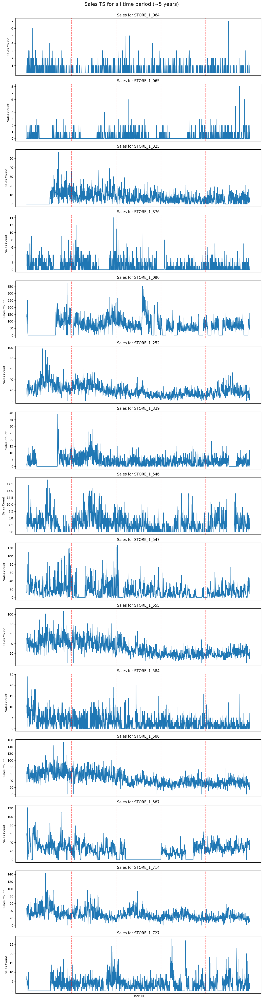

In [ ]:
fig, axes = plt.subplots(n_items, 1, figsize=(12, 3 * n_items), sharex=True)

for ax, item in zip(axes, unique_items):
    item_sales = sales[sales["item_id"] == item]
    ax.plot(item_sales["date_id"], item_sales["cnt"])

    # Draw vertical lines at each 365 date_id
    for year in range(365, n_days + 1, 365):
        ax.axvline(x=year, color="red", linestyle="--", alpha=0.5)

    ax.set_title(f"Sales for {item}")
    ax.set_ylabel("Sales Count")
    ax.set_xticks([])

fig.suptitle("Sales TS for all time period (~5 years)", fontsize=16, y=1)
axes[-1].set_xlabel("Date ID")
plt.tight_layout()
plt.show()

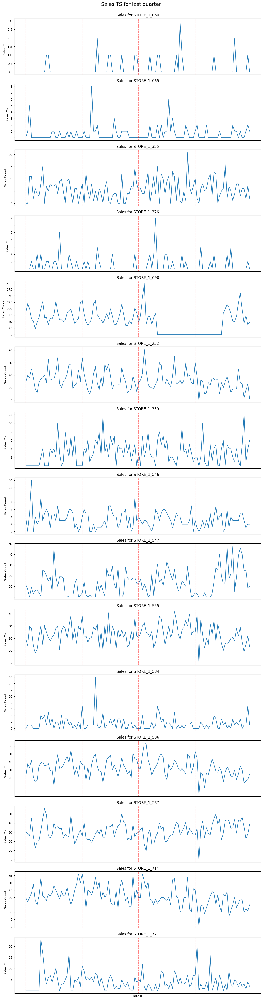

In [ ]:
fig, axes = plt.subplots(n_items, 1, figsize=(12, 3 * n_items), sharex=True)

for ax, item in zip(axes, unique_items):
    item_sales = sales[sales["item_id"] == item][-120:]  # Last quarter
    ax.plot(item_sales["date_id"], item_sales["cnt"])

    # Draw vertical lines at each 30 date_id
    min_date = item_sales["date_id"].min()
    max_date = item_sales["date_id"].max()
    for d in range(min_date, max_date + 1, 30):
        ax.axvline(x=d, color="red", linestyle="--", alpha=0.5)

    ax.set_title(f"Sales for {item}")
    ax.set_ylabel("Sales Count")
    ax.set_xticks([])

fig.suptitle("Sales TS for last quarter", fontsize=16, y=1)
axes[-1].set_xlabel("Date ID")
plt.tight_layout()
plt.show()

Наблюдения:
* в каждом ВР хорошо наблюдаются частые периодические пики продаж (предполагаю, что это недельные сезонности - на выходных спрос больше)
* почти в каждом ВР есть отрезки с нулевыми продажами. Как краткосрочные (товар действительно покупают не каждый день), так и долгосрочные (возможно товар закончился/проблемы с поставкой)
* у некоторых ВР отсутствует выраженный долгосрочный тренд продаж (064), а у некоторых присутствует (252)
* часто наблюдаются вплески продаж (как однодневные, так и довольно продолжительные (2-3 недели)), однако называть это аномалиями не хочется, так как предполагаю, что это может быть причиной праздников (данные по которым у нас есть)
* среди 15 товаров есть как популярные (090 - покупают в среднем по 150 раз в день), так и довольно редкие (064 - 1 продажа в день)

### Анализ dates

In [ ]:
dates.head()

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,date_id,CASHBACK_STORE_1
0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,1,0
1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,2,0
2,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,3,0
3,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,4,0
4,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,5,1


In [ ]:
dates["date"] = pd.to_datetime(dates["date"])

In [ ]:
cashback_store_1 = dates[dates["CASHBACK_STORE_1"] == 1]
print(f"Number of days with cashback in STORE_1: {len(cashback_store_1)}")

Number of days with cashback in STORE_1: 600


In [ ]:
num_days_one_event = dates["event_name_1"].notna().sum()
num_days_two_events = (dates["event_name_1"].notna() & dates["event_name_2"].notna()).sum()

print(f"Number of days with one event: {num_days_one_event}")
print(f"Number of days with two events: {num_days_two_events}")

Number of days with one event: 146
Number of days with two events: 4


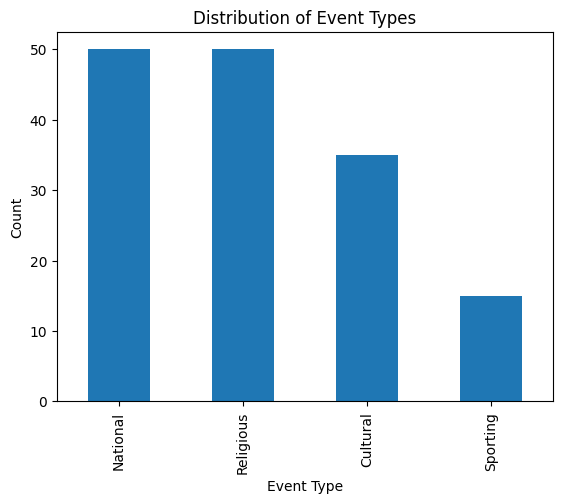

In [ ]:
event_types = pd.concat([dates["event_type_1"], dates["event_type_2"]])
event_types = event_types.dropna()

event_types.value_counts().plot(kind="bar")
plt.title("Distribution of Event Types")
plt.xlabel("Event Type")
plt.ylabel("Count")
plt.show()

In [ ]:
# Concat sales and dates
sales_dates = pd.merge(sales, dates, on="date_id", how="left")
utils.pretty_info(sales_dates, "sales_dates")

sales_dates:
  Columns: ['item_id', 'date_id', 'cnt', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'CASHBACK_STORE_1']
  Rows: 27285
--------------------------------------------------


In [ ]:
sales_dates.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1
0,STORE_1_064,1,0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,0
1,STORE_1_064,2,1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,0
2,STORE_1_064,3,0,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,0
3,STORE_1_064,4,0,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,0
4,STORE_1_064,5,0,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,1


### Анализ prices

In [ ]:
prices.head()

,item_id,wm_yr_wk,sell_price
22,STORE_1_064,11101,2.54
23,STORE_1_065,11101,2.94
24,STORE_1_376,11101,1.98
25,STORE_1_090,11101,1.25
26,STORE_1_252,11101,1.48


In [ ]:
prices.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3873 entries, 22 to 11140
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   item_id     3873 non-null   object 
 1   wm_yr_wk    3873 non-null   int64  
 2   sell_price  3873 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 121.0+ KB


Цены указаны для каждой недели:

In [ ]:
for item_id in unique_items:
    print(item_id, len(sales_dates[sales_dates["item_id"] == item_id]), len(prices[prices["item_id"] == item_id]) * 7)

STORE_1_064 1819 1820
STORE_1_065 1819 1820
STORE_1_325 1819 1631
STORE_1_376 1819 1820
STORE_1_090 1819 1820
STORE_1_252 1819 1820
STORE_1_339 1819 1820
STORE_1_546 1819 1820
STORE_1_547 1819 1820
STORE_1_555 1819 1820
STORE_1_584 1819 1820
STORE_1_586 1819 1820
STORE_1_587 1819 1820
STORE_1_714 1819 1820
STORE_1_727 1819 1820


Для товара STORE_1_325 пропущено 189 / 7 = 27 недель с ценами. 

In [ ]:
# Concat prices and sales_dates
sales_dates_prices = pd.merge(sales_dates, prices, on=["wm_yr_wk", "item_id"], how="left")
utils.pretty_info(sales_dates_prices, "sales_dates_prices")

sales_dates_prices:
  Columns: ['item_id', 'date_id', 'cnt', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'CASHBACK_STORE_1', 'sell_price']
  Rows: 27285
--------------------------------------------------


In [ ]:
sales_dates_prices.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
0,STORE_1_064,1,0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,0,2.54
1,STORE_1_064,2,1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,0,2.54
2,STORE_1_064,3,0,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,0,2.54
3,STORE_1_064,4,0,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,0,2.54
4,STORE_1_064,5,0,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,1,2.54


In [ ]:
sales_dates_prices["sell_price"].isna().sum()

189

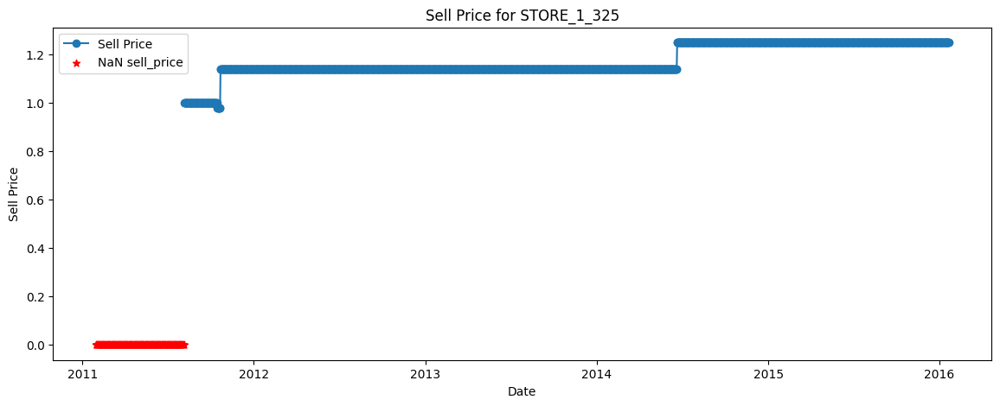

In [ ]:
item_id = "STORE_1_325"
item_data = sales_dates_prices[sales_dates_prices["item_id"] == item_id]

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(item_data["date"], item_data["sell_price"], label="Sell Price", marker="o", linestyle="-")

nan_mask = item_data["sell_price"].isna()
ax.scatter(item_data.loc[nan_mask, "date"], [0] * nan_mask.sum(), marker="*", color="red", label="NaN sell_price")

ax.set_title(f"Sell Price for {item_id}")
ax.set_xlabel("Date")
ax.set_ylabel("Sell Price")
ax.legend()
plt.show()

Не проблема, что есть NaN, так как такие старые значения мы не будем использовать (отсечка будет с date_id: 1819 - 120 (test) - 365 * 3 (train/val) = 604)

### Отсечка данных

In [ ]:
sales_dates_prices.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
0,STORE_1_064,1,0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,0,2.54
1,STORE_1_064,2,1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,0,2.54
2,STORE_1_064,3,0,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,0,2.54
3,STORE_1_064,4,0,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,0,2.54
4,STORE_1_064,5,0,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,1,2.54


In [ ]:
# Как было и описано выше, обрежем слишком старые данные
test_size = 120  # Last quarter
train_val_size = 365 * 3  # 2 + 1 years for train and validation

sales_dates_prices = sales_dates_prices[
    sales_dates_prices["date_id"] >= sales_dates_prices["date_id"].max() - test_size - train_val_size
]
sales_dates_prices = sales_dates_prices.reset_index(drop=True)

sales_dates_prices["date"].min(), sales_dates_prices["date"].max()

(Timestamp('2012-09-23 00:00:00'), Timestamp('2016-01-21 00:00:00'))

## По каждому товару

В этой секции проанализирую ВР каждого товара на предмет тренда, сезонности, автокорреляций.

In [ ]:
# Тут уже возьмем только train и validation часть (чтобы не было утечки в тест)
sales_dates_prices = sales_dates_prices[
    sales_dates_prices["date_id"] < sales_dates_prices["date_id"].max() - test_size
]
sales_dates_prices["date"].min(), sales_dates_prices["date"].max()

(Timestamp('2012-09-23 00:00:00'), Timestamp('2015-09-22 00:00:00'))

### Item 064

In [ ]:
item_id = "STORE_1_064"
item_data = sales_dates_prices[sales_dates_prices["item_id"] == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
0,STORE_1_064,604,0,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,2.54
1,STORE_1_064,605,1,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,2.54
2,STORE_1_064,606,0,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,2.54
3,STORE_1_064,607,1,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,2.54
4,STORE_1_064,608,0,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,2.54


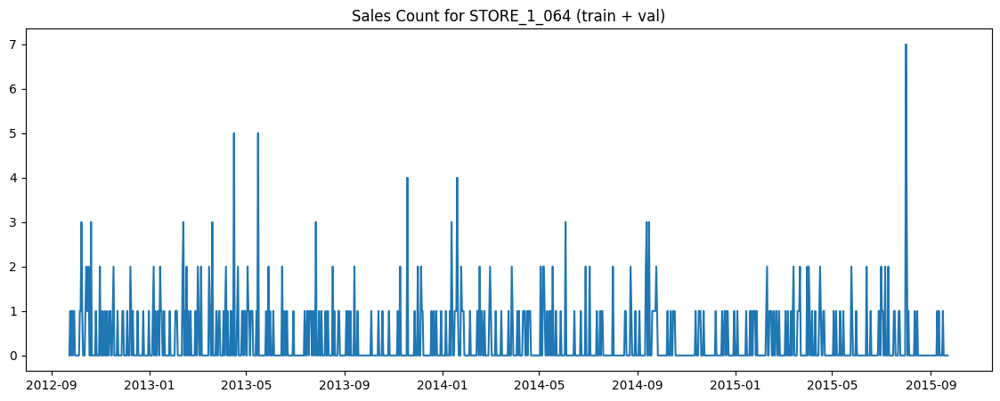

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

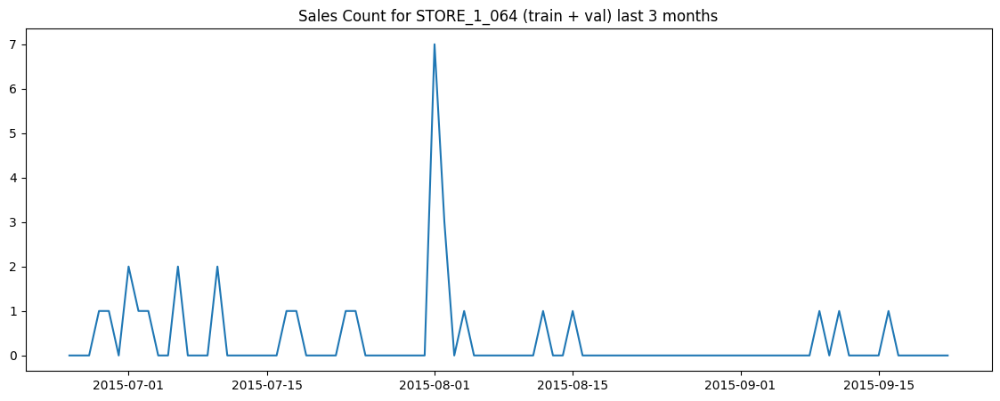

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-90:], item_data.cnt[-90:])
plt.title(f"Sales Count for {item_id} (train + val) last 3 months")
plt.show()

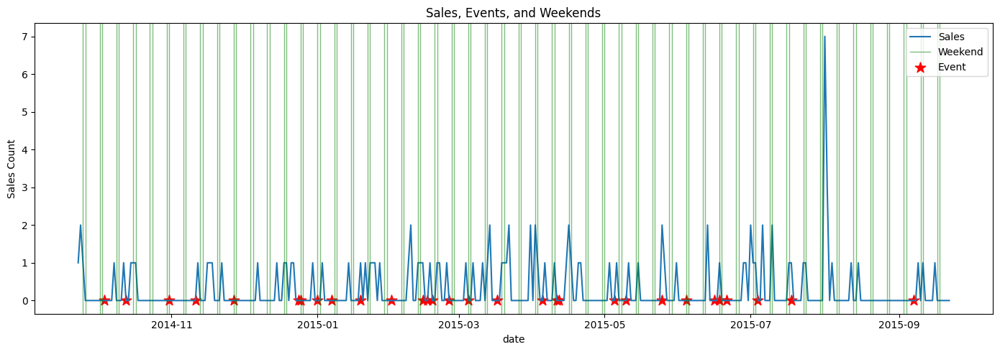

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

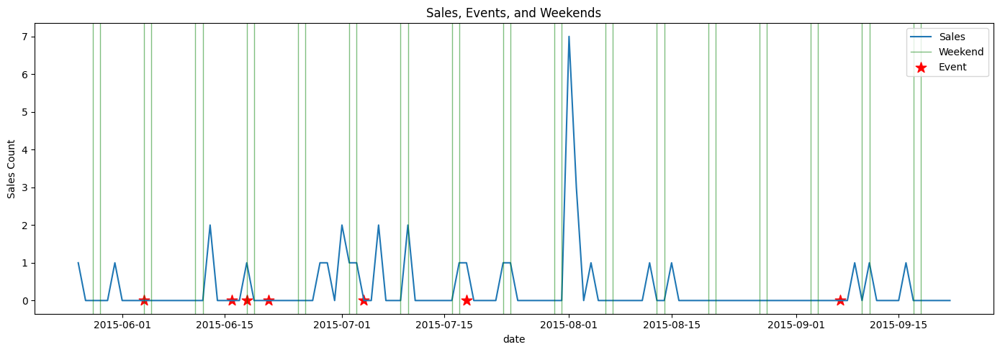

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.  
Корреляции продаж с праздниками/выходными не наблюдается.

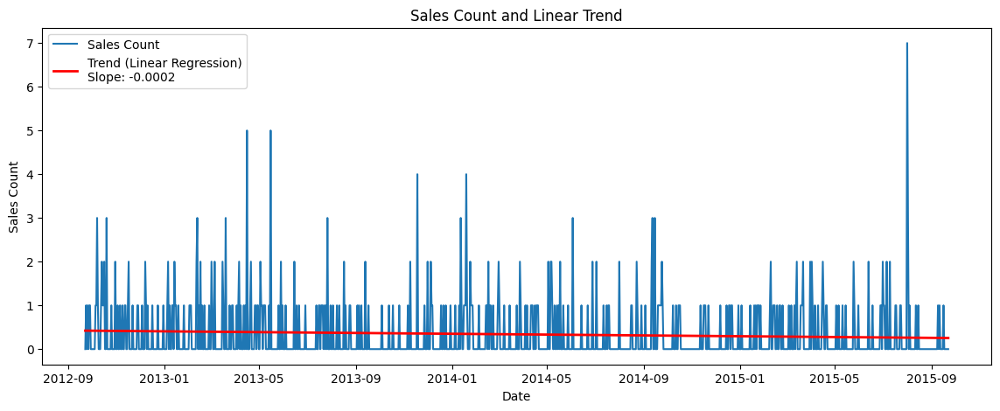

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

(True, {'KPSS': 0.0363253004050241, 'ADF': 0.0})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


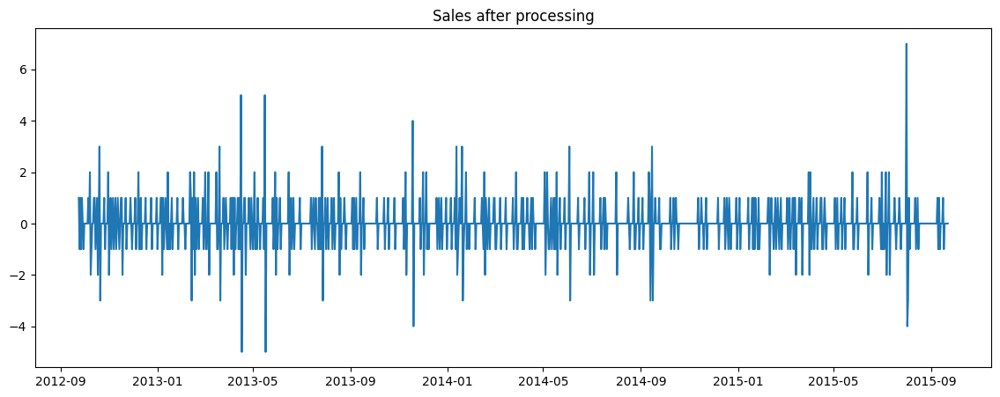

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 3.0524683457314216e-19})

Теперь статистические тесты указывают на то, что ряд стационарен.

Построим графики ACF и PACF для этого стационарного ряда.

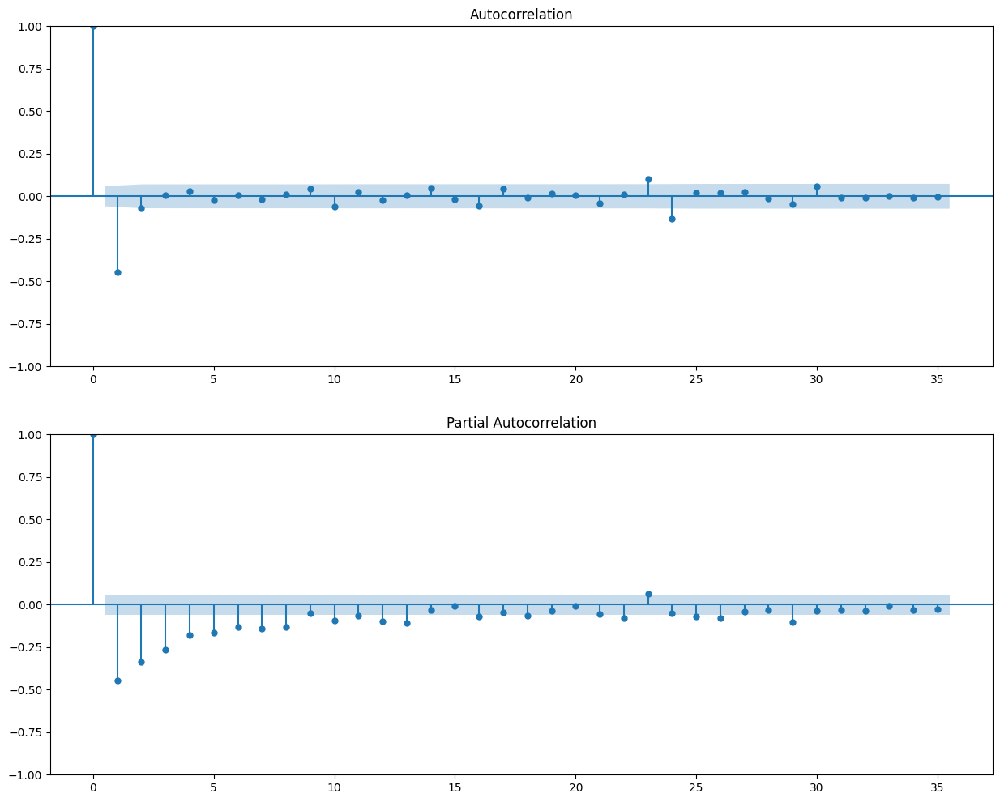

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 23, 24]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 16, 18, 22, 23, 25, 26, 29]


Большое кол-во статзначимых лагов в ACF и PACF говорит о том, что значения ряда имеют много зависимостей от предыдущих значений.

Также эти рассчитанные лаги будут нужны нам для определения оптимальных гиперпараметров AR и MA частей моделей SARIMA(X).

### Item 065

In [ ]:
item_id = "STORE_1_065"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
1216,STORE_1_065,604,2,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,3.28
1217,STORE_1_065,605,0,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,3.28
1218,STORE_1_065,606,0,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,3.28
1219,STORE_1_065,607,0,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,3.28
1220,STORE_1_065,608,2,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,3.28


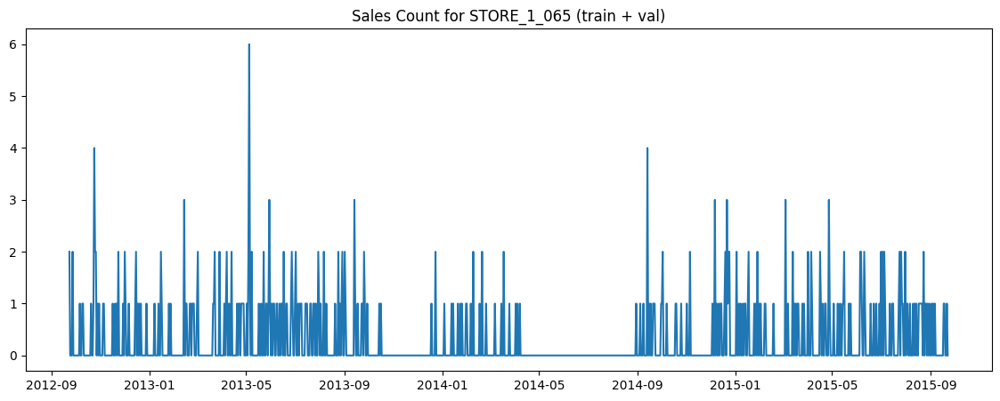

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

Наблюдаем довольно длительные промежутки с нулевыми продажами.  
Избавляться от этих промежутков не вижу смысла, так как не считаю такие отрезки аномалиями из-за того, что абсолютное количество продаж небольшое (диапазон 1-5 шт в день), поэтому такие ситуации (нулевые продажи) могут повторяться и в будущем и мы хотим их предсказывать (хотя скорее всего, фичей по которым мы могли бы определить такие отрезки у нас нет).

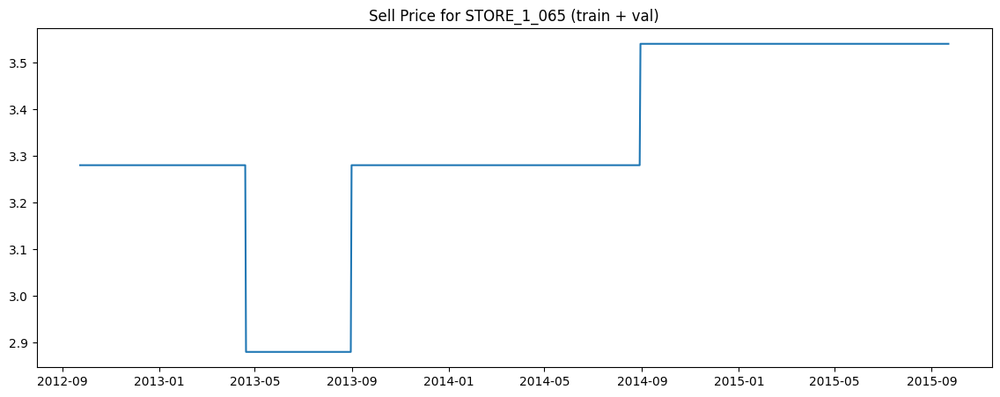

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

Нулевые продажи не зависят от цены товара.

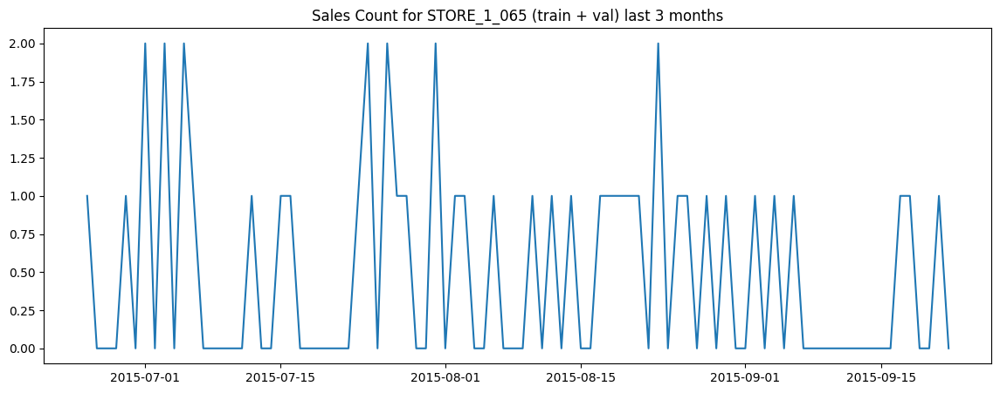

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-90:], item_data.cnt[-90:])
plt.title(f"Sales Count for {item_id} (train + val) last 3 months")
plt.show()

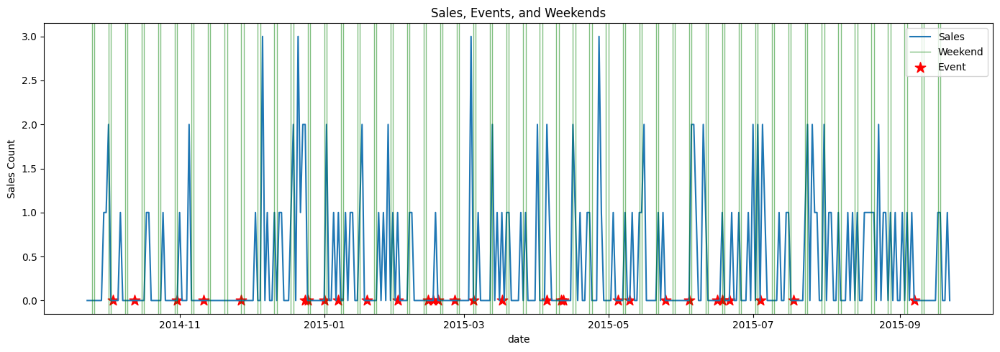

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

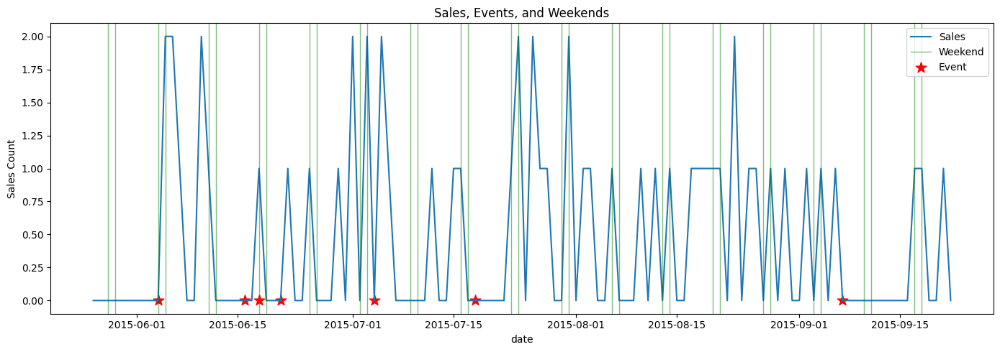

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.  
Корреляция продаж с выходными/праздниками не наблюдается.  

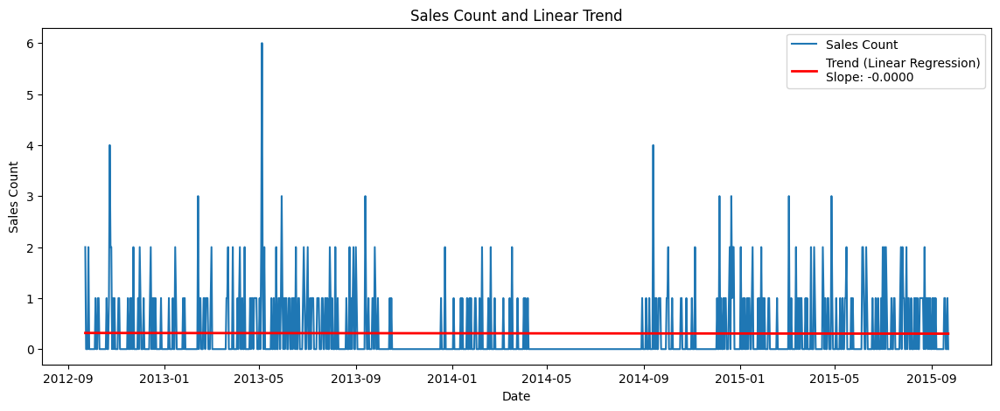

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

Видим, что линейного тренда тут точно нет (наклон 0).

In [ ]:
utils.test_trend(item_data.cnt)

(True, {'KPSS': 0.02222925690022555, 'ADF': 8.015501428077484e-08})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


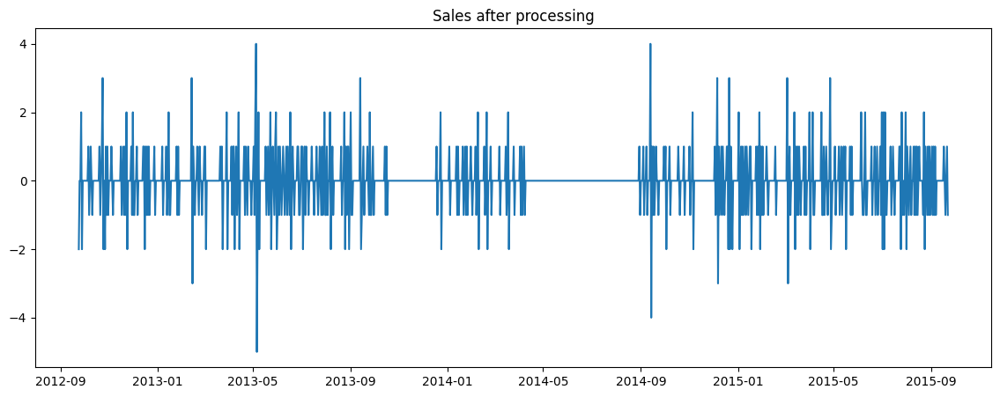

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 6.581226279712799e-23})

Теперь статистические тесты указывают на то, что ряд стационарен.

Построим графики ACF и PACF для этого стационарного ряда.

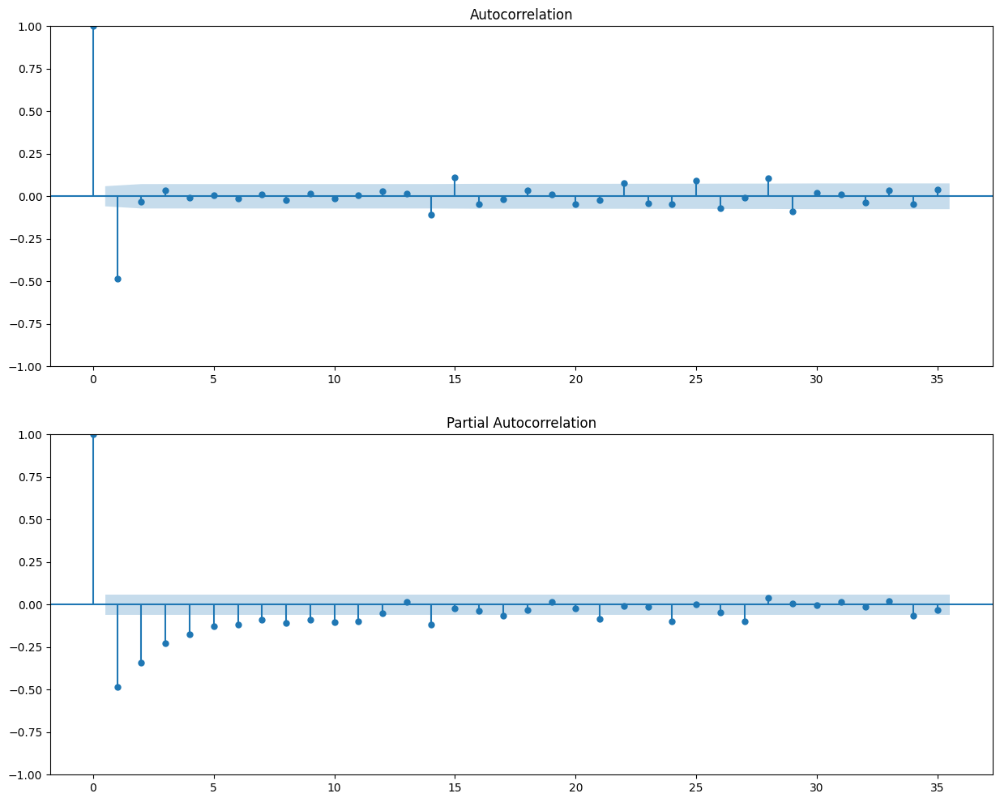

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 14, 15, 22, 25, 28, 29]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 14, 17, 21, 24, 27, 34]


### Item 325

In [ ]:
item_id = "STORE_1_325"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
2432,STORE_1_325,604,17,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.14
2433,STORE_1_325,605,3,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.14
2434,STORE_1_325,606,4,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.14
2435,STORE_1_325,607,5,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.14
2436,STORE_1_325,608,0,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.14


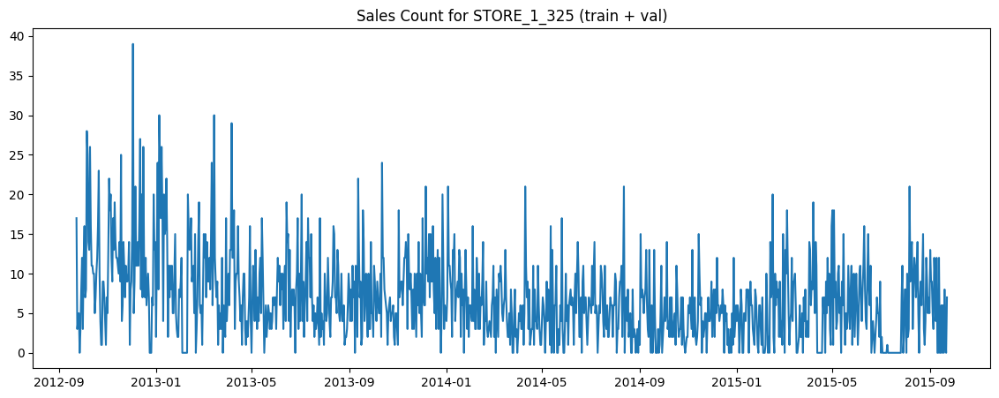

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

Наблюдаем небольшой нисходящий нелинейный тренд (похож на $1 / x$).

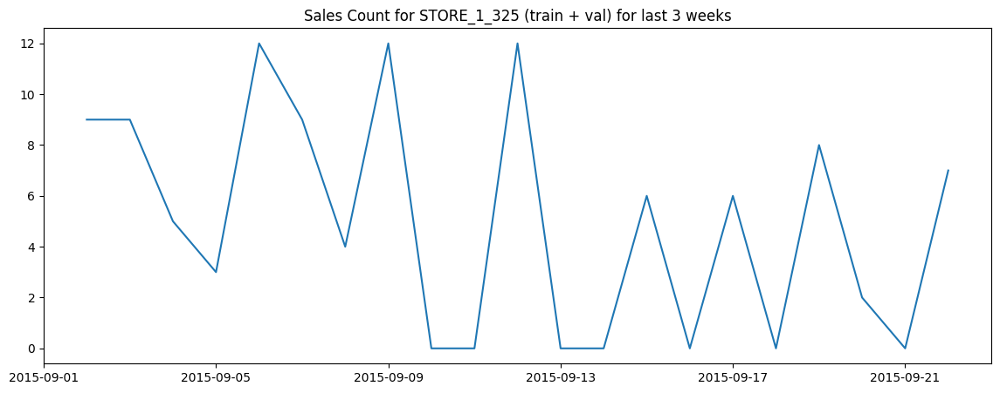

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) for last 3 weeks")
plt.show()

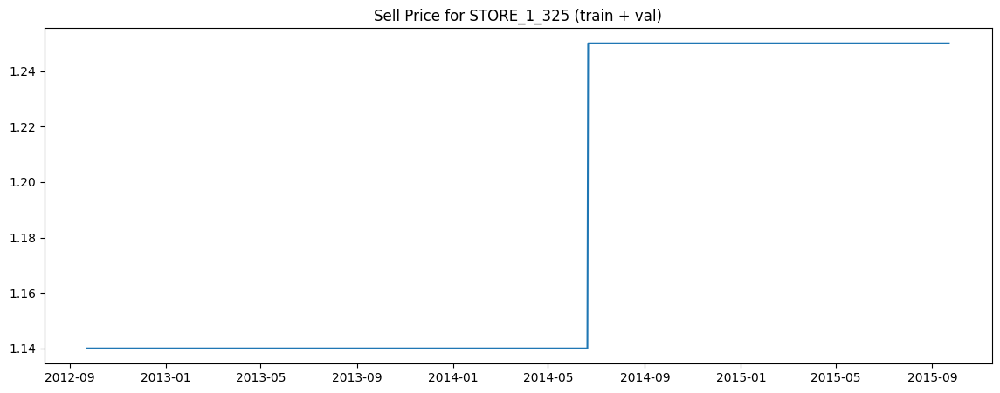

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

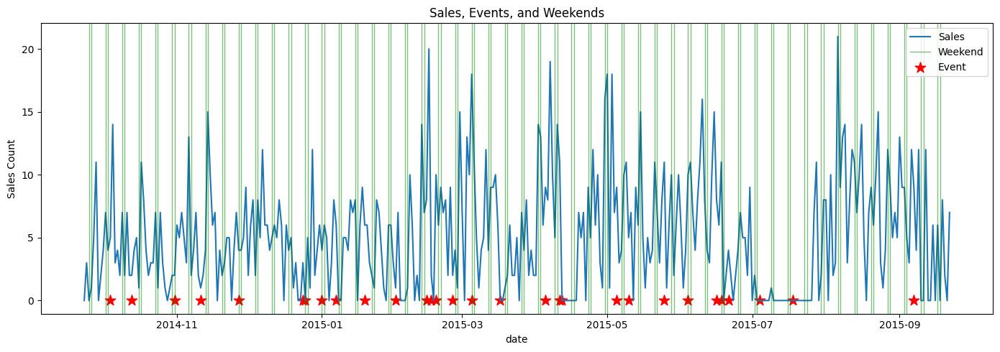

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

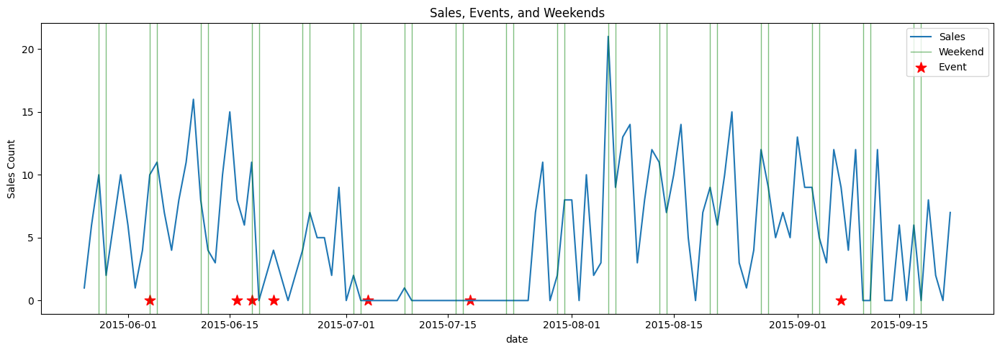

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Сезонности не наблюдается.  
Корреляции продаж с праздниками/выходными не наблюдается.

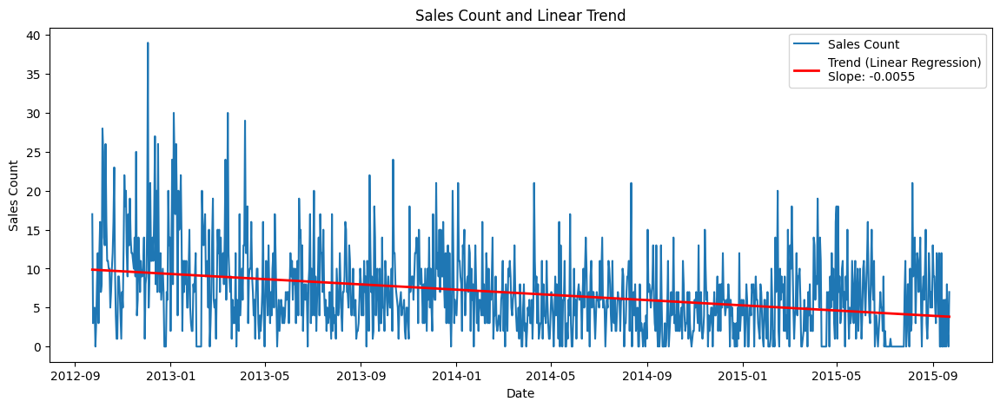

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 2.2808125979499937e-10})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии ВР
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
box_cox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = box_cox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/3116992679.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = box_cox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


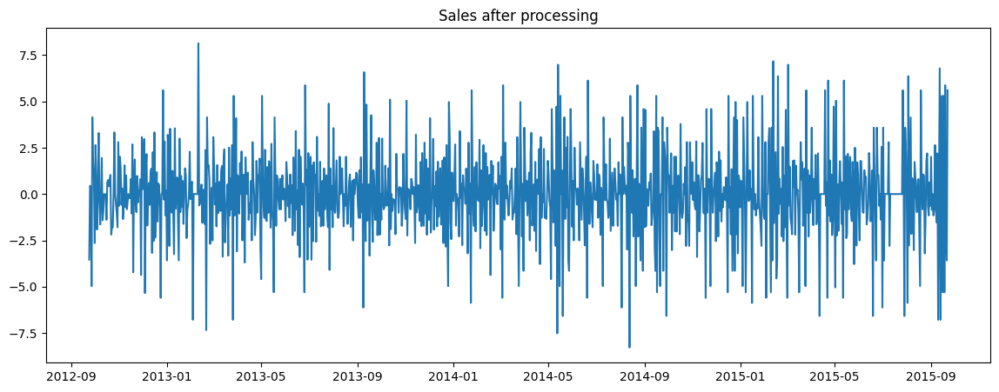

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

(False, {'KPSS': 0.08849970469765671, 'ADF': 1.4482364361674088e-20})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

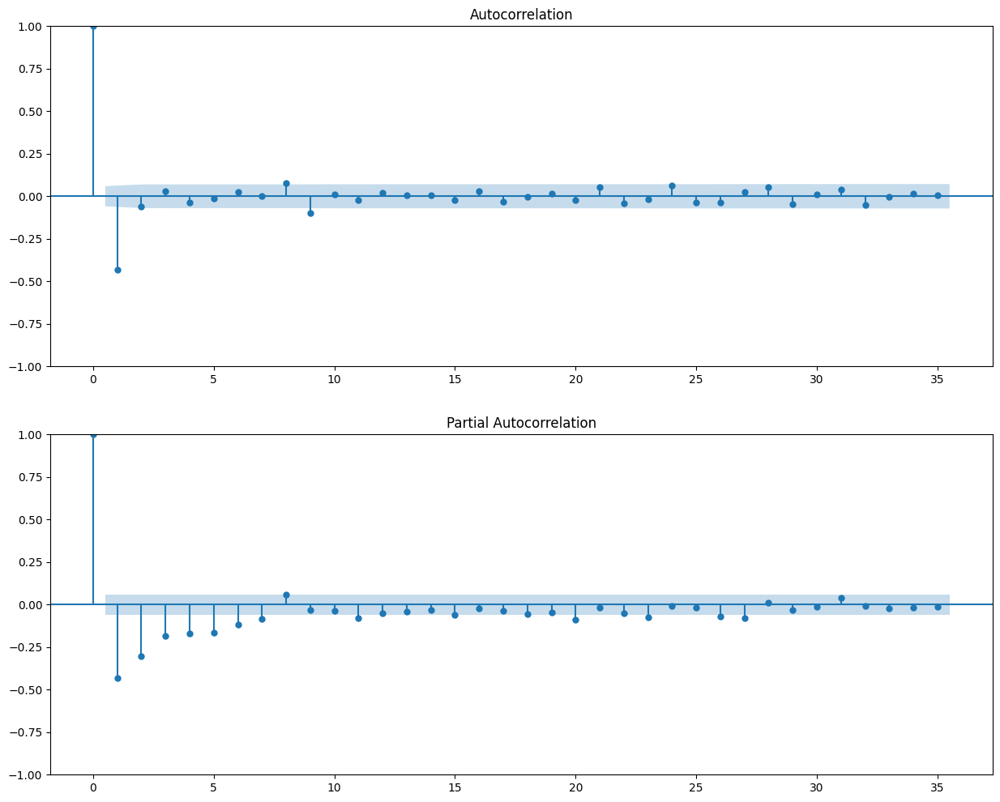

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 8, 9]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 20, 23, 26, 27]


### Item 376

In [ ]:
item_id = "STORE_1_376"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
3648,STORE_1_376,604,0,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.98
3649,STORE_1_376,605,0,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.98
3650,STORE_1_376,606,0,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.98
3651,STORE_1_376,607,0,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.98
3652,STORE_1_376,608,0,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.98


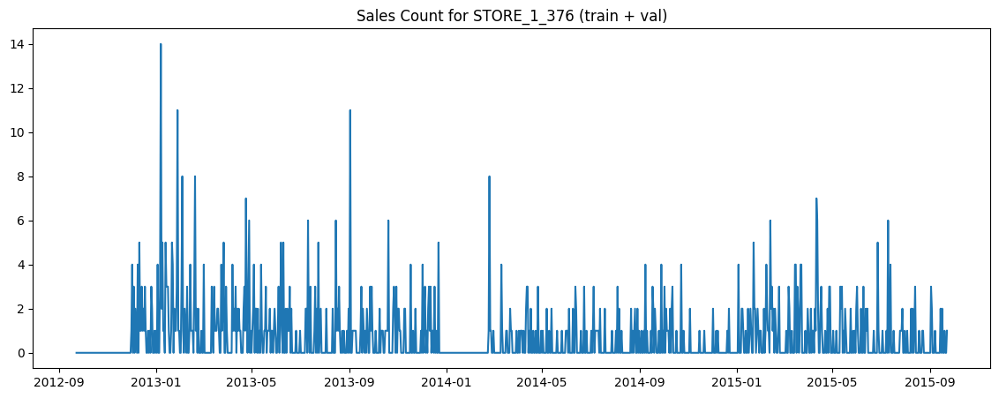

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

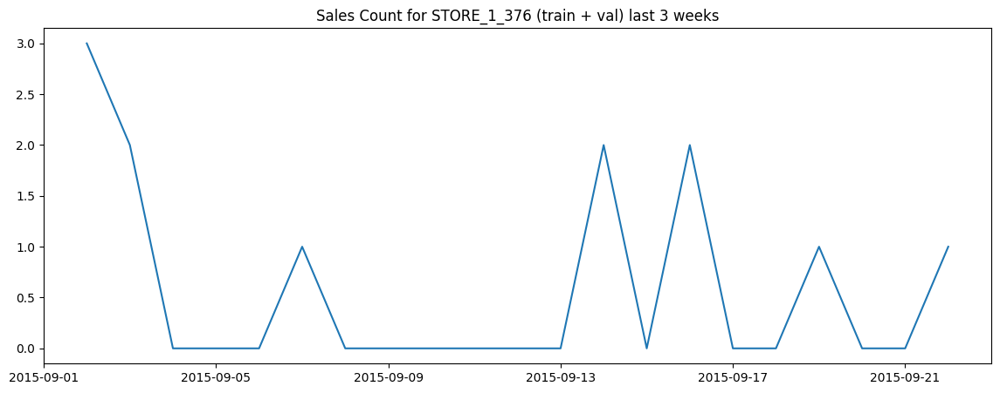

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) last 3 weeks")
plt.show()

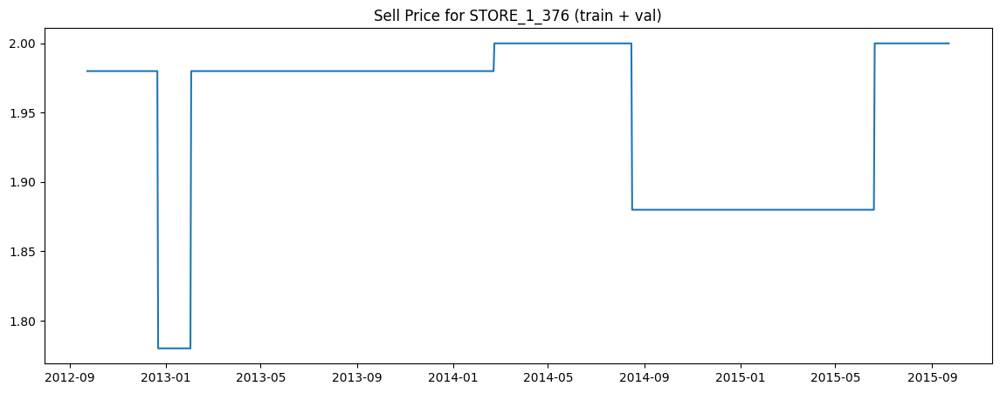

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

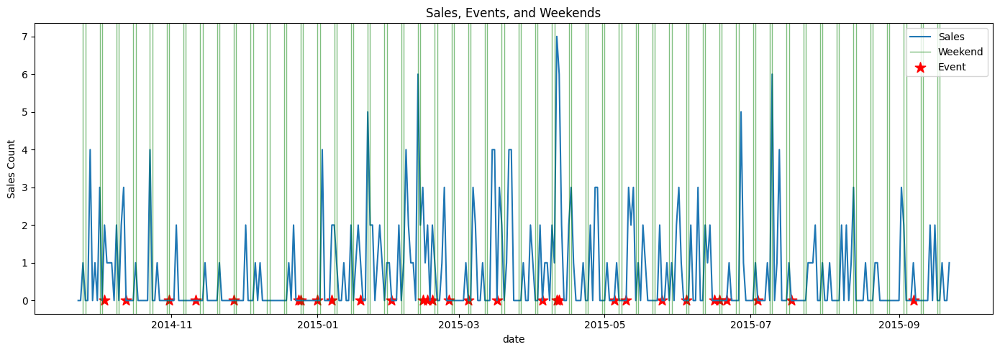

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

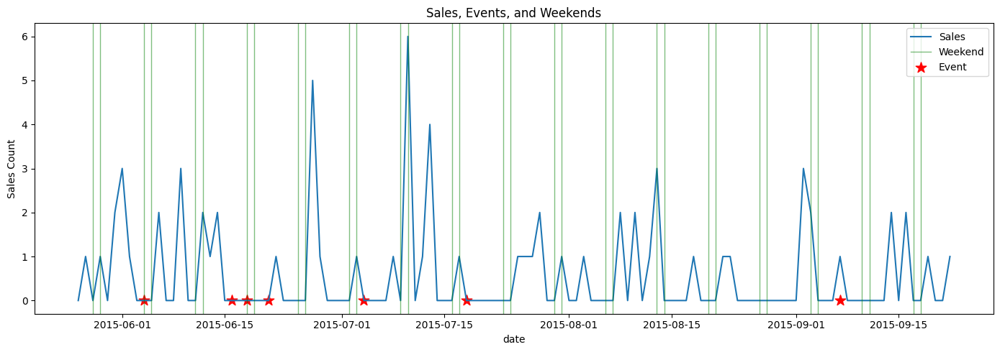

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.  
Корреляции продаж с праздниками/выходными не наблюдается.

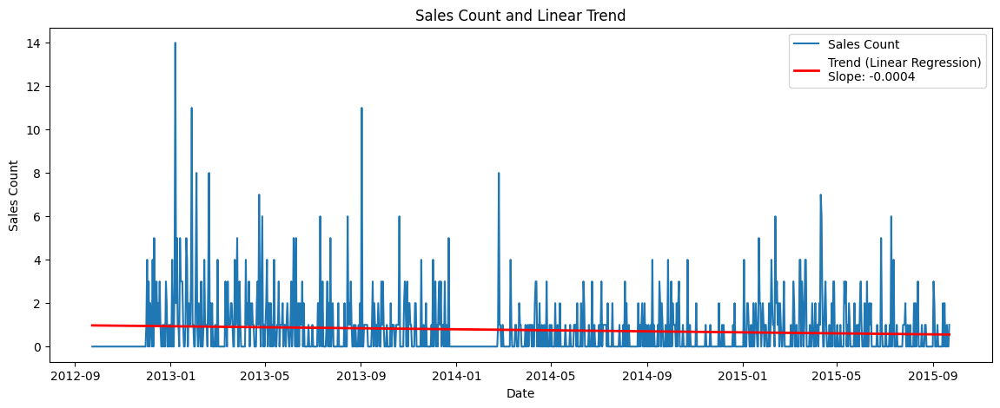

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

(True, {'KPSS': 0.012499413379568171, 'ADF': 0.00034642750896867624})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


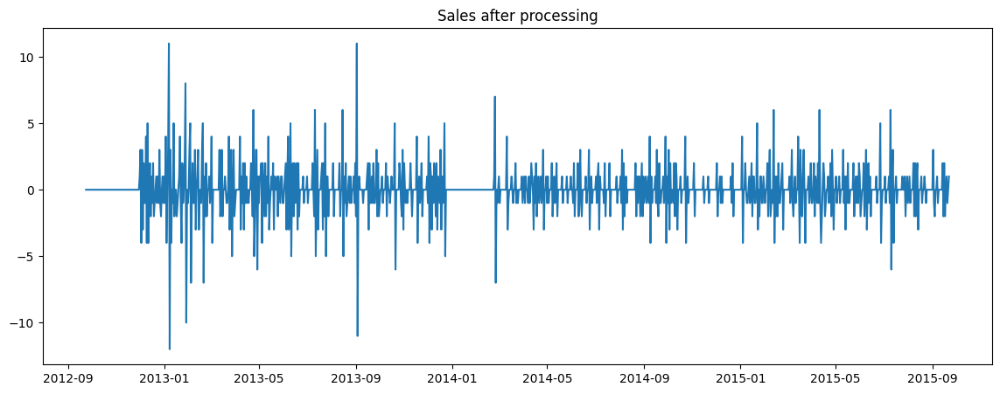

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.63646961012073e-23})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

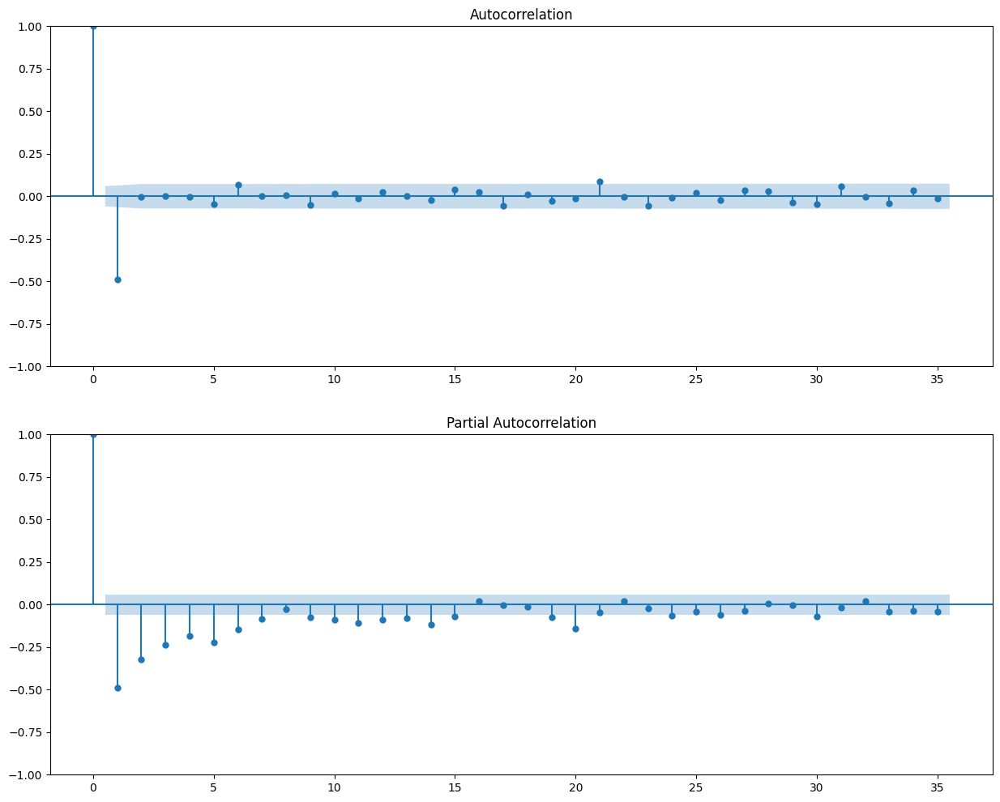

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 21]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 19, 20, 24, 30]


### Item 090

In [ ]:
item_id = "STORE_1_090"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
4864,STORE_1_090,604,61,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.38
4865,STORE_1_090,605,36,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.38
4866,STORE_1_090,606,63,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.38
4867,STORE_1_090,607,39,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.38
4868,STORE_1_090,608,61,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.38


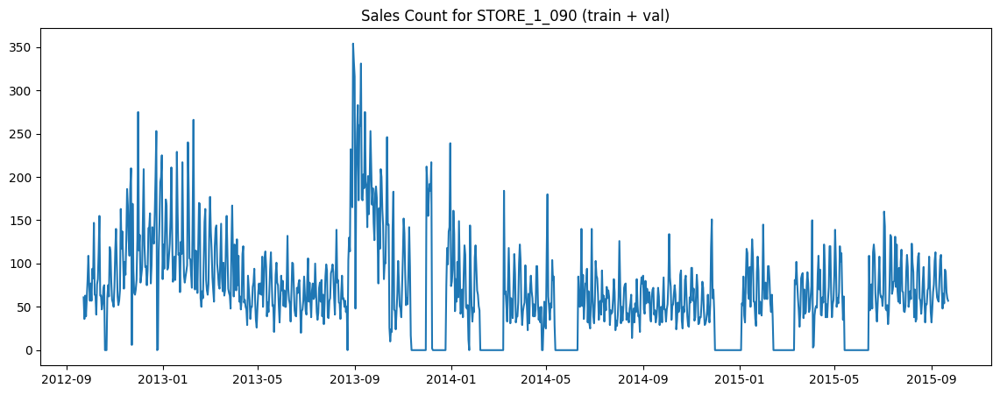

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

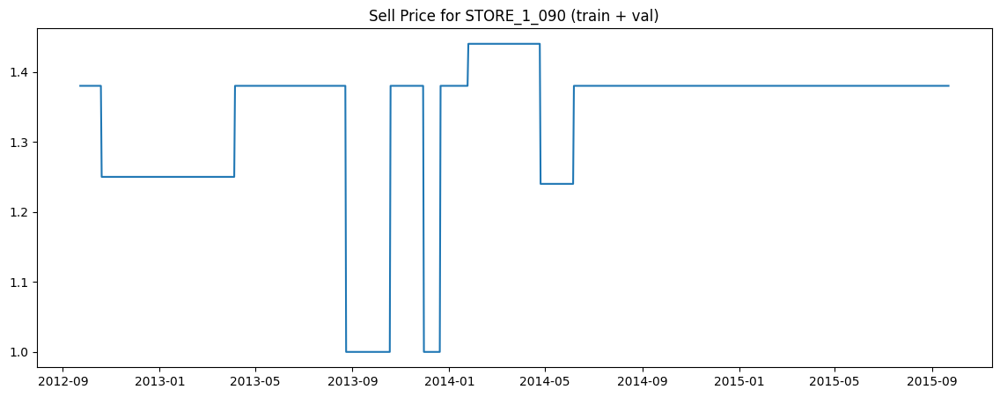

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

Скачок продаж (2013-08) случился из-за снижения цены почти на 50%.

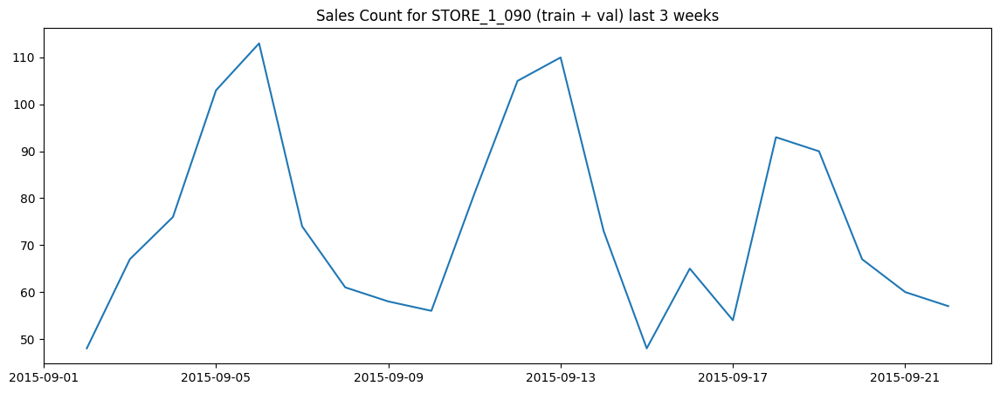

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) last 3 weeks")
plt.show()

Наблюдаем недельный цикл (не сезонность, так как интервал не постоянный).

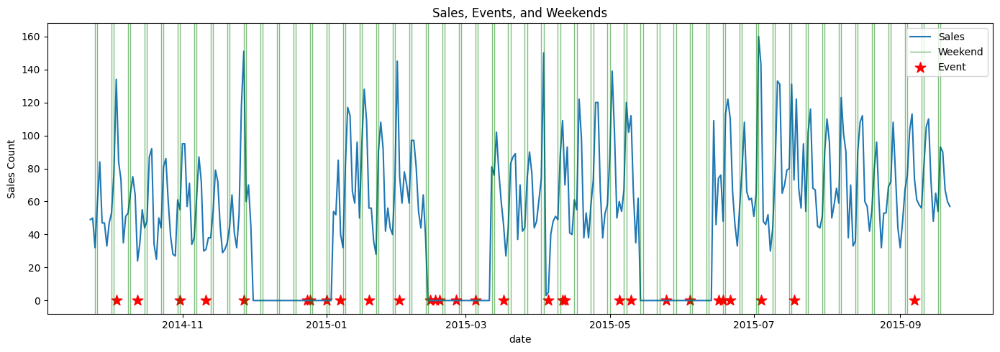

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

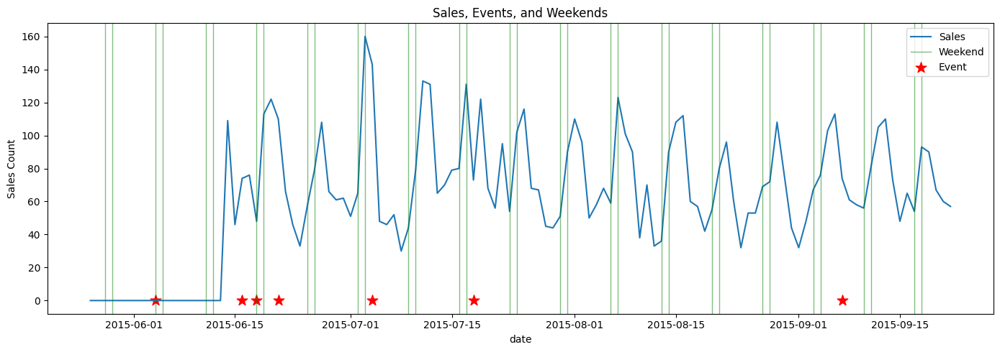

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренда не наблюдаем.  
Наблюдается недельный цикл - продажи начинают расти на выходных, ко вторнику достигают пика, а затем падают.  

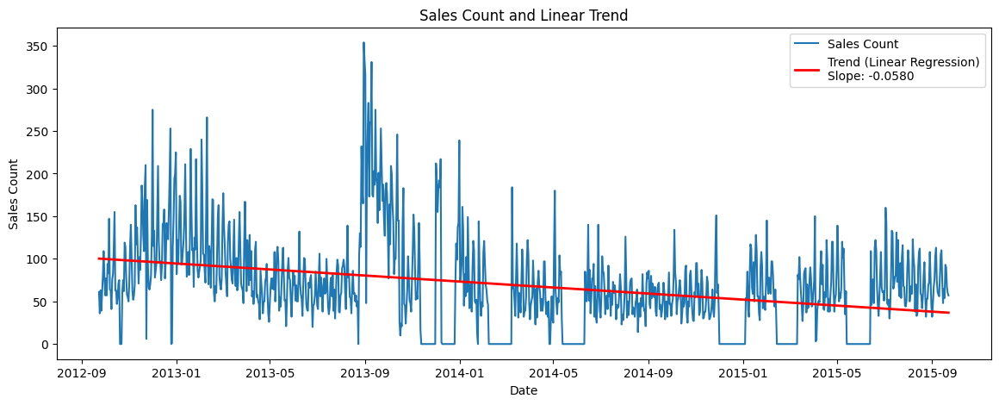

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.007772234770779643})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


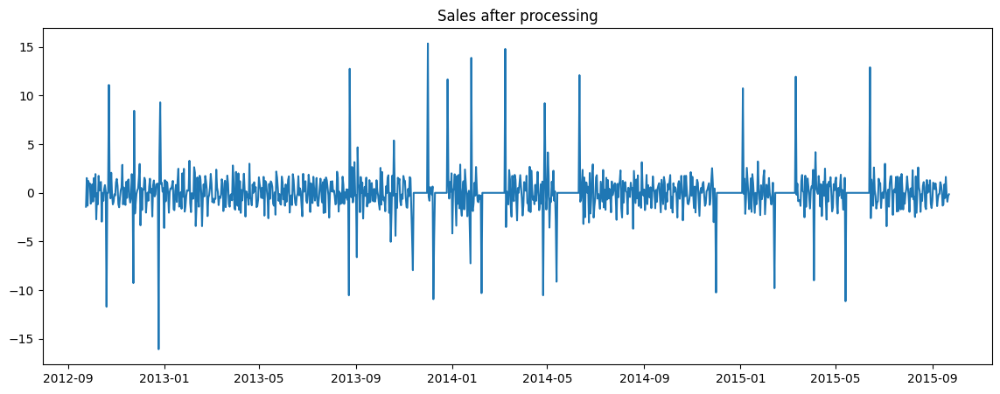

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.876435298606376e-16})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

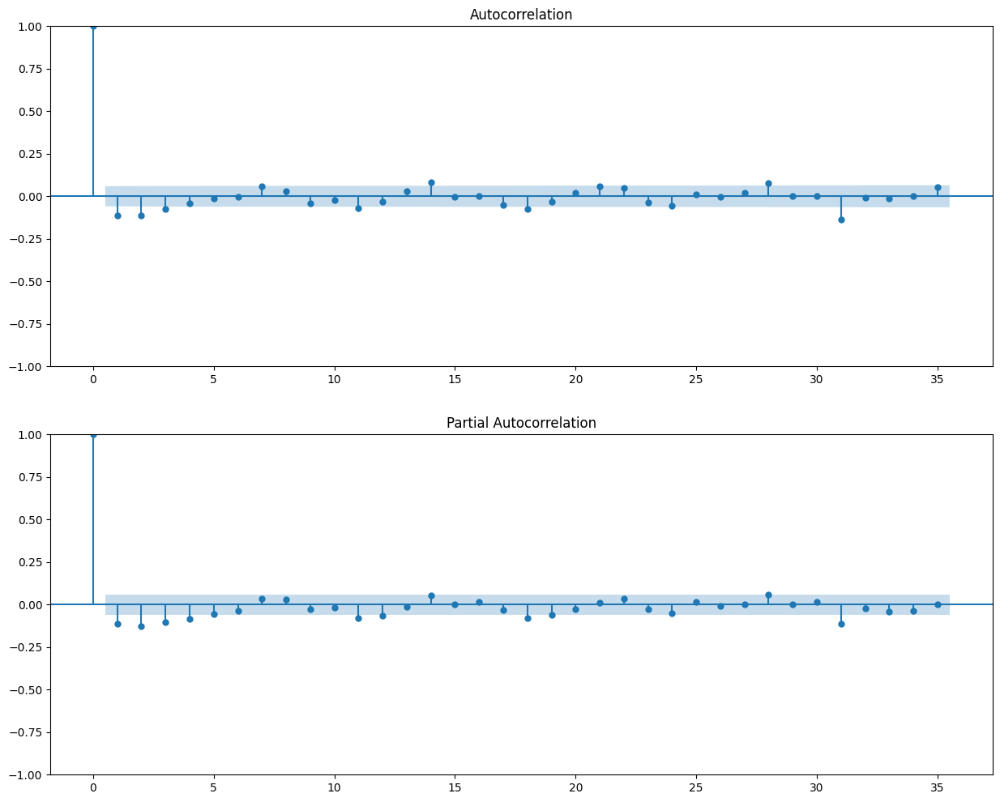

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 11, 14, 18, 28, 31]
Significant PACF lags: [0, 1, 2, 3, 4, 11, 12, 18, 19, 28, 31]


### Item 252

In [ ]:
item_id = "STORE_1_252"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
6080,STORE_1_252,604,21,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.48
6081,STORE_1_252,605,15,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.48
6082,STORE_1_252,606,20,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.48
6083,STORE_1_252,607,17,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.48
6084,STORE_1_252,608,27,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.48


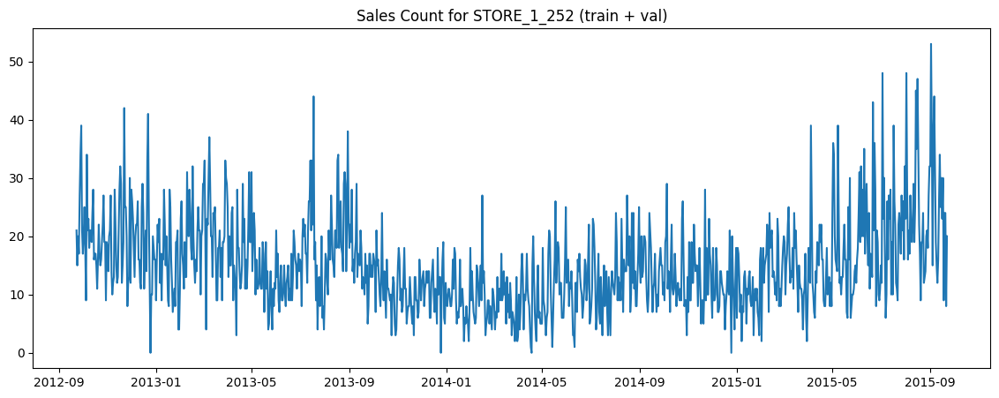

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

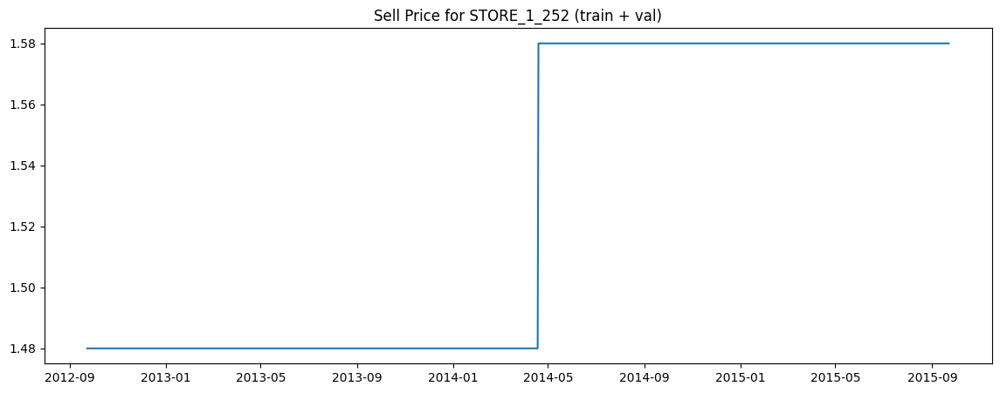

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

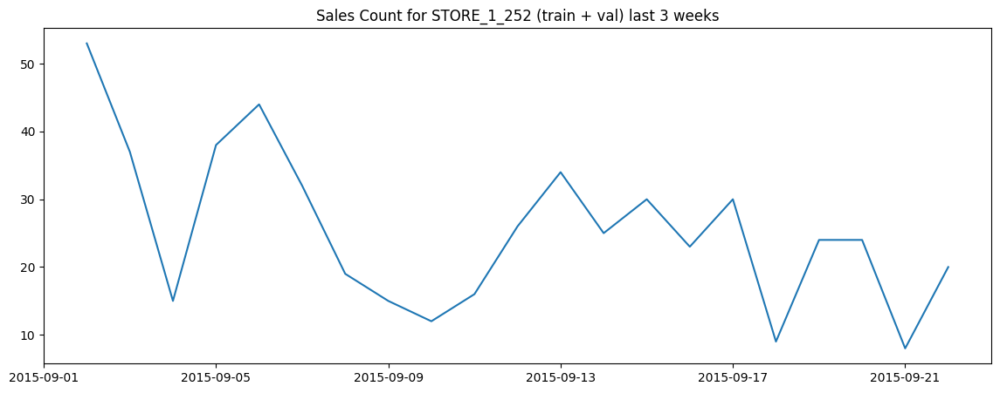

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) last 3 weeks")
plt.show()

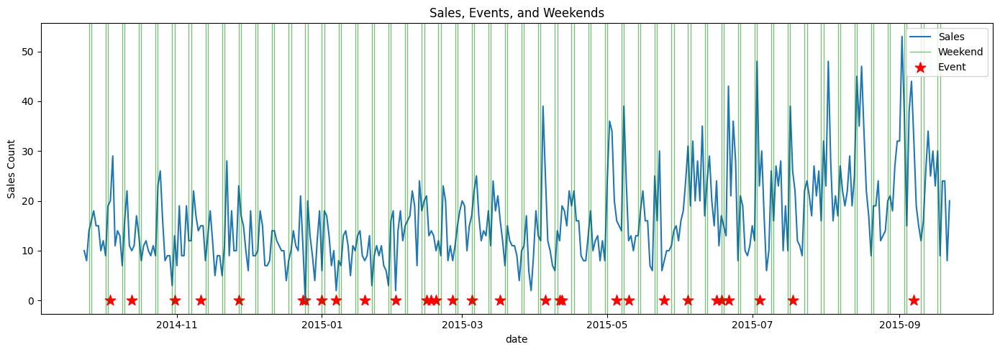

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

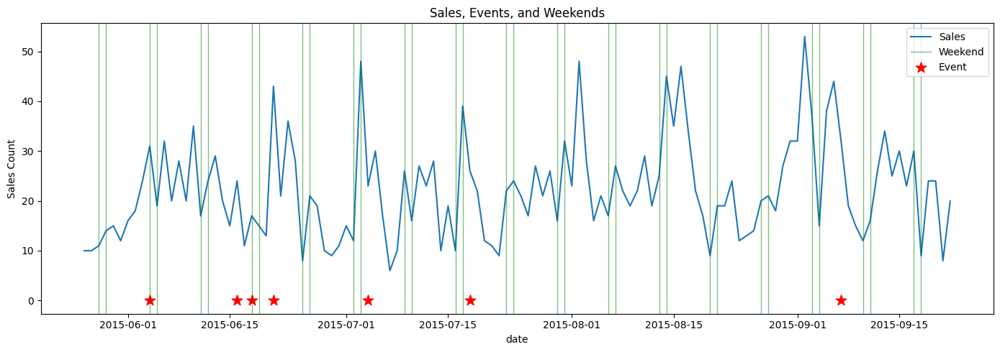

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Небольшой восходящий тренд.  
Сезонности не наблюдается.  

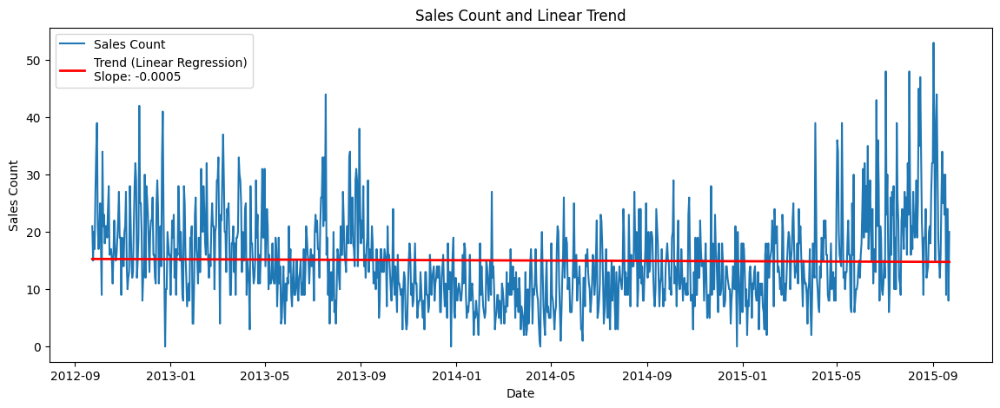

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.04682165239972233})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


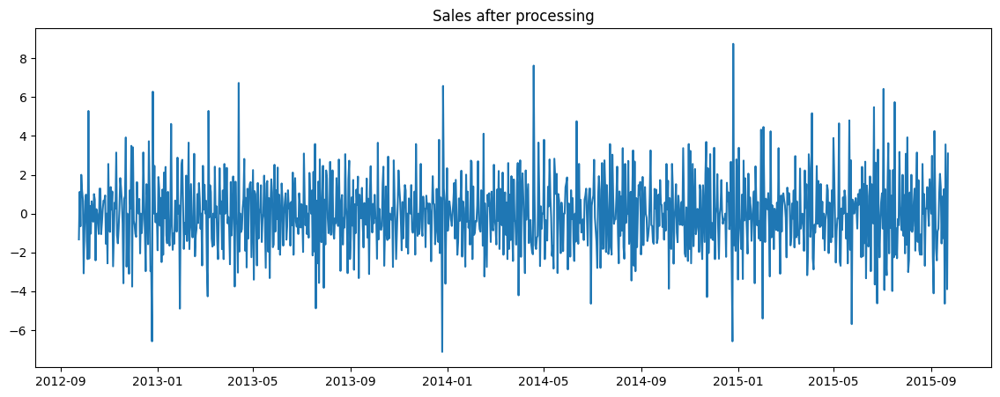

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 4.3089887423199953e-23})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

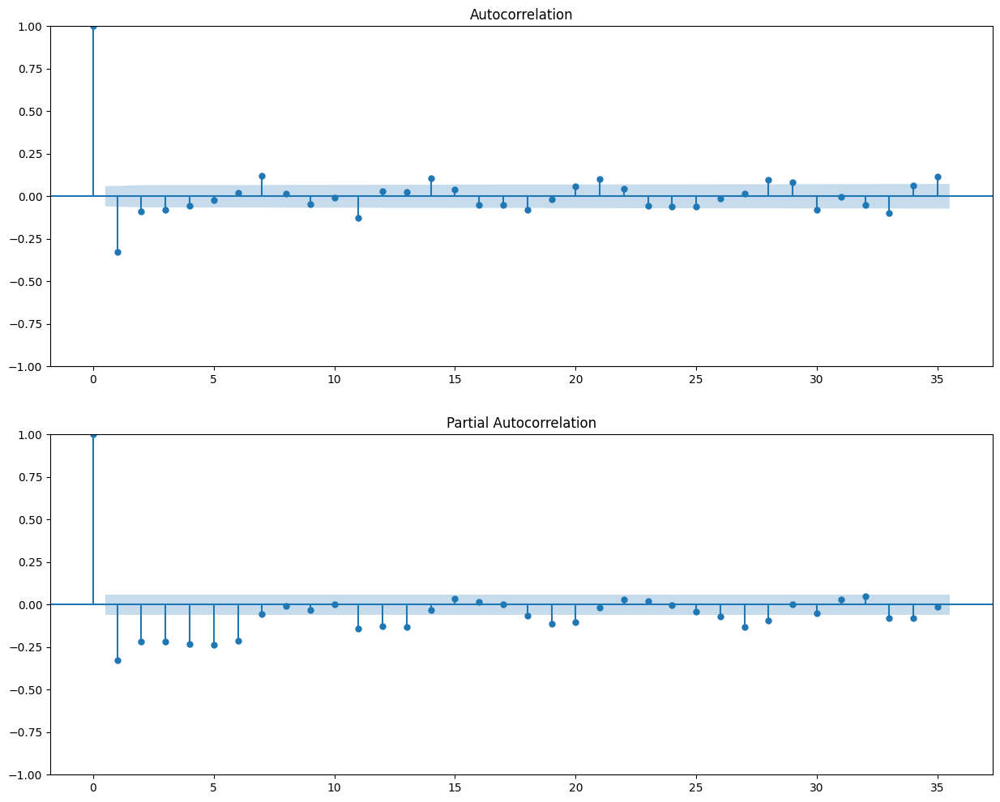

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 7, 11, 14, 18, 21, 28, 29, 30, 33, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 11, 12, 13, 18, 19, 20, 26, 27, 28, 33, 34]


### Item 339

In [ ]:
item_id = "STORE_1_339"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
7296,STORE_1_339,604,11,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,0.78
7297,STORE_1_339,605,0,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,0.78
7298,STORE_1_339,606,6,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,0.78
7299,STORE_1_339,607,1,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,0.78
7300,STORE_1_339,608,6,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,0.78


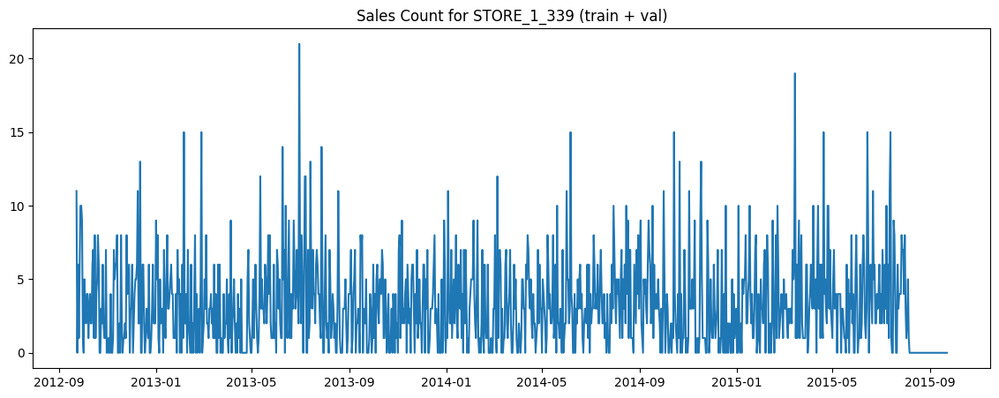

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

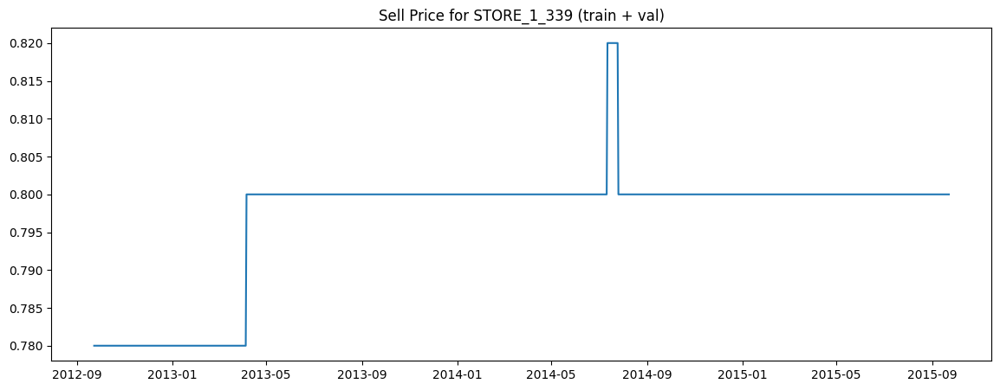

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

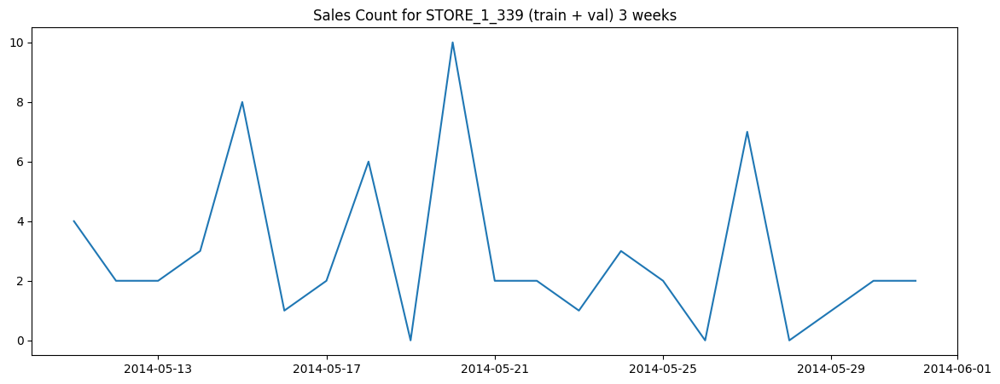

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-500:-479], item_data.cnt[-500:-479])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

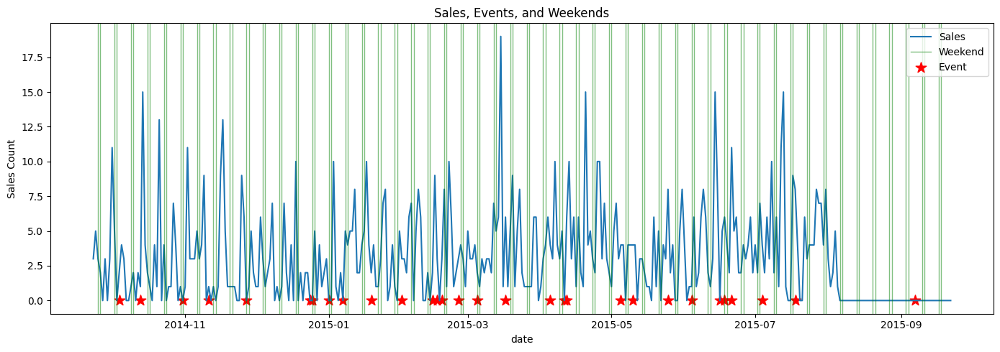

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

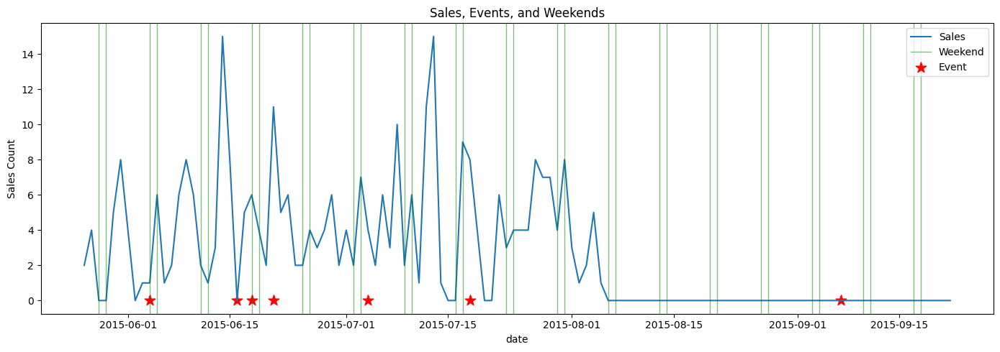

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.  

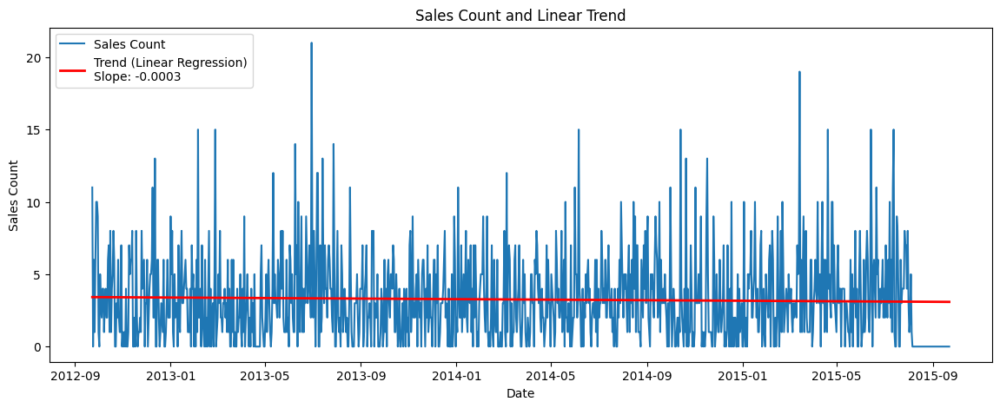

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 0.0017224448537185887})

Критерии говорят о том, что ряд стационарен - построим графики ACF и PACF.

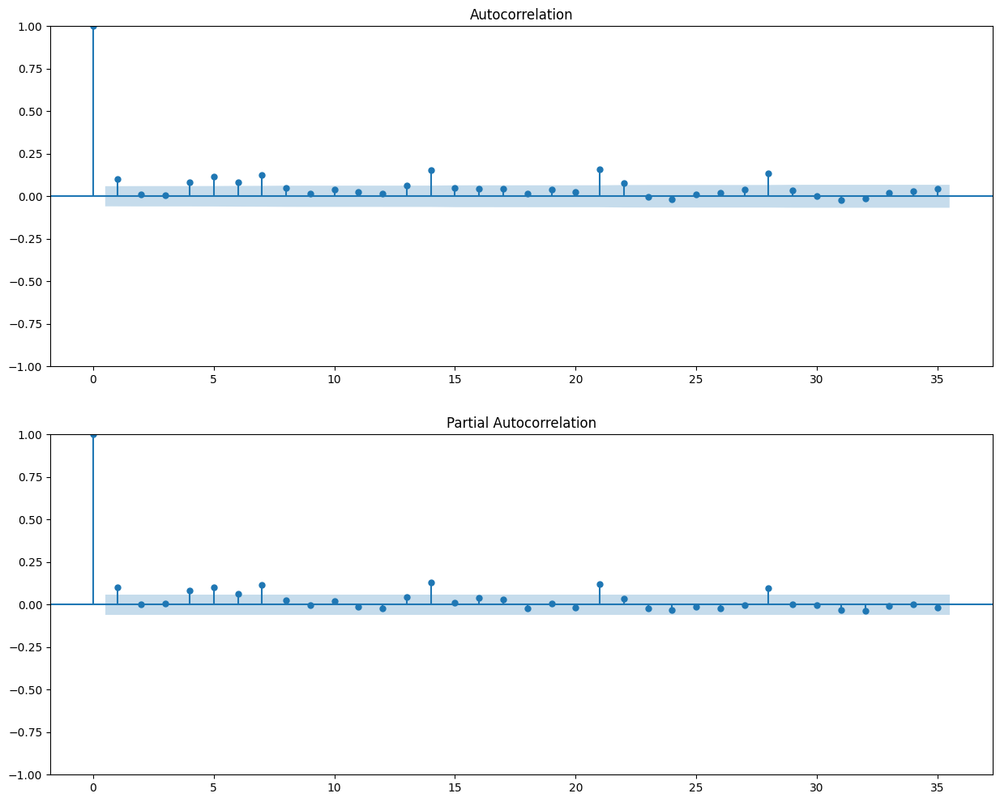

In [ ]:
fig, (acf_ax, pacf_ax) = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt.dropna(), ax=acf_ax, lags=35)
tsaplots.plot_pacf(item_data.cnt.dropna(), ax=pacf_ax, lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 4, 5, 6, 7, 13, 14, 21, 22, 28]
Significant PACF lags: [0, 1, 4, 5, 6, 7, 14, 21, 28]


### Item 546

In [ ]:
item_id = "STORE_1_546"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
8512,STORE_1_546,604,10,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,5.98
8513,STORE_1_546,605,3,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,5.98
8514,STORE_1_546,606,2,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,5.98
8515,STORE_1_546,607,4,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,5.98
8516,STORE_1_546,608,0,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,5.98


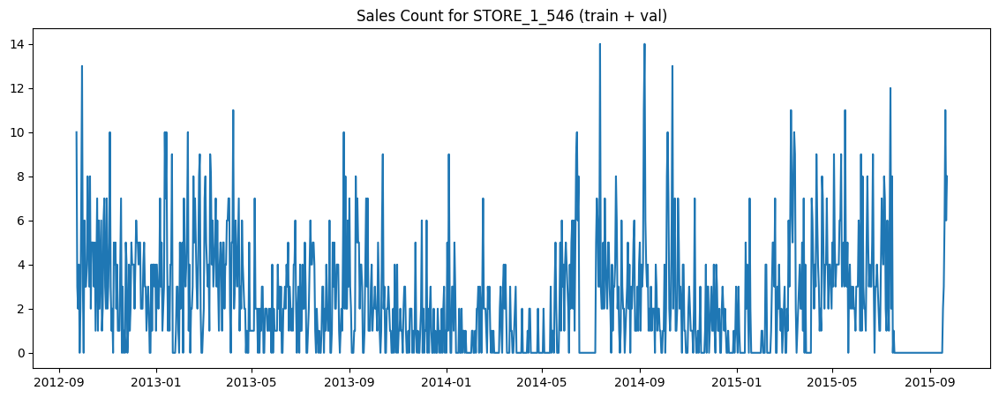

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

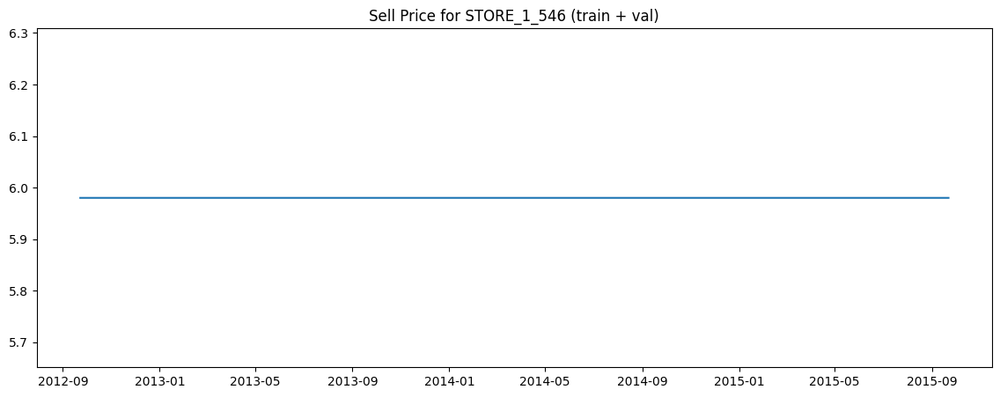

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

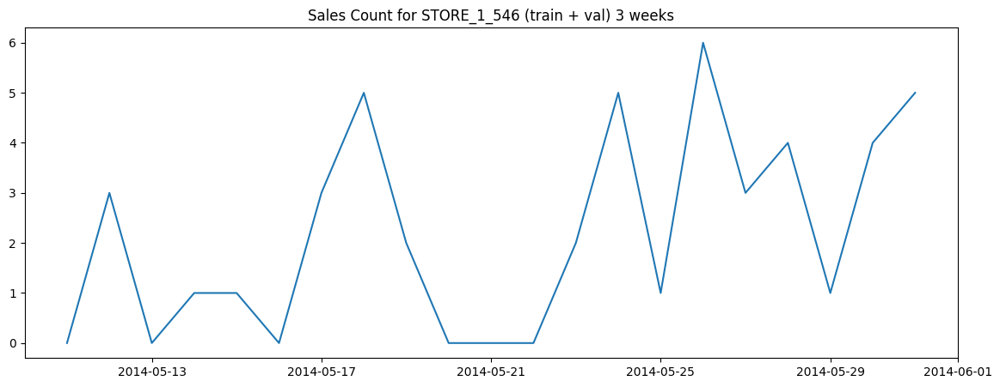

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-500:-479], item_data.cnt[-500:-479])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

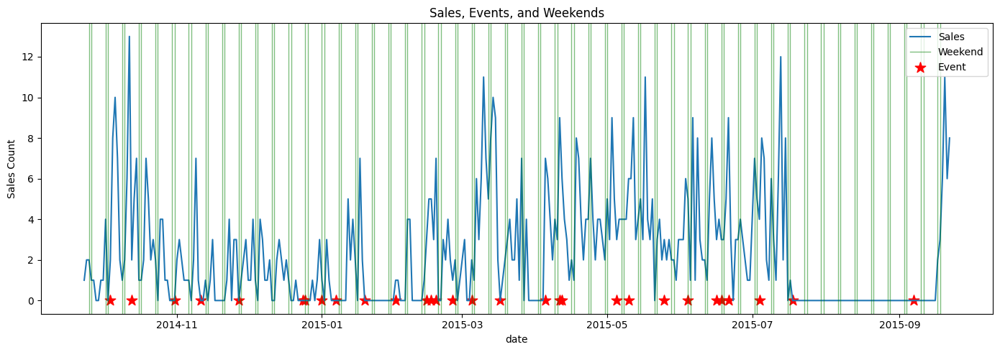

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

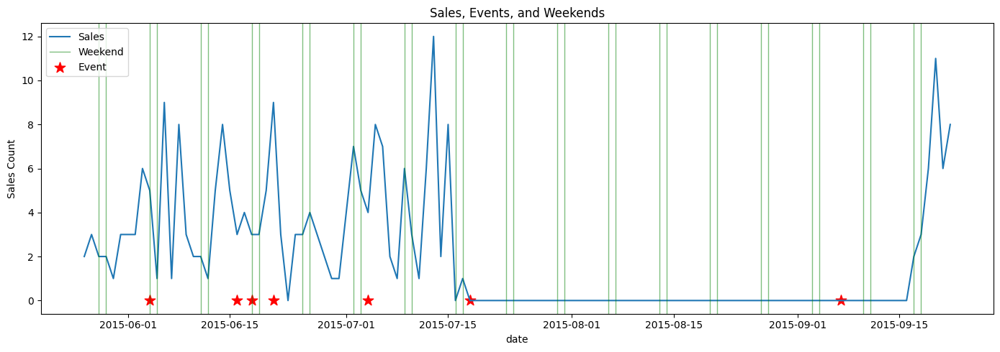

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд скорее восходящий.  
Сезонности не наблюдается.  
Корреляции с выходными/праздниками не наблюдается.

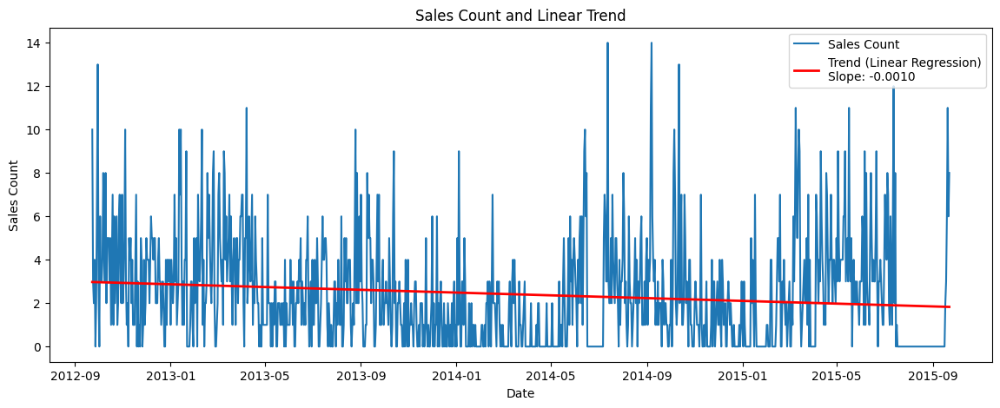

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

(True, {'KPSS': 0.01841937982224359, 'ADF': 6.568845127618638e-06})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


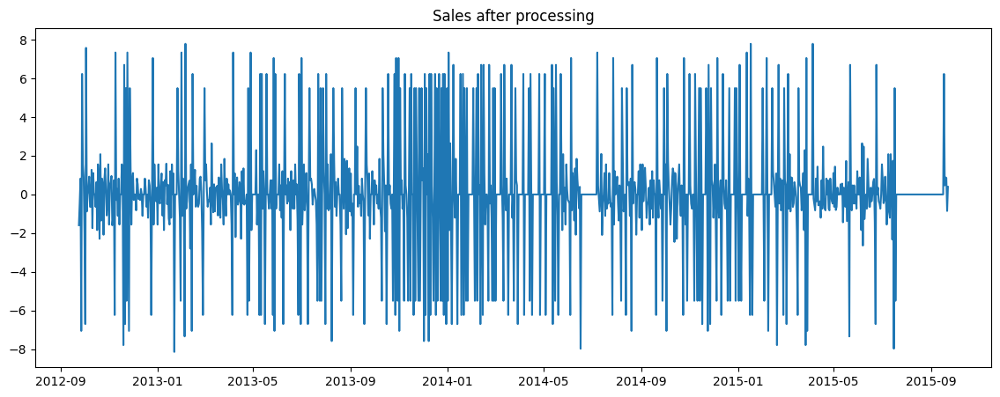

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.7645283440637785e-20})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

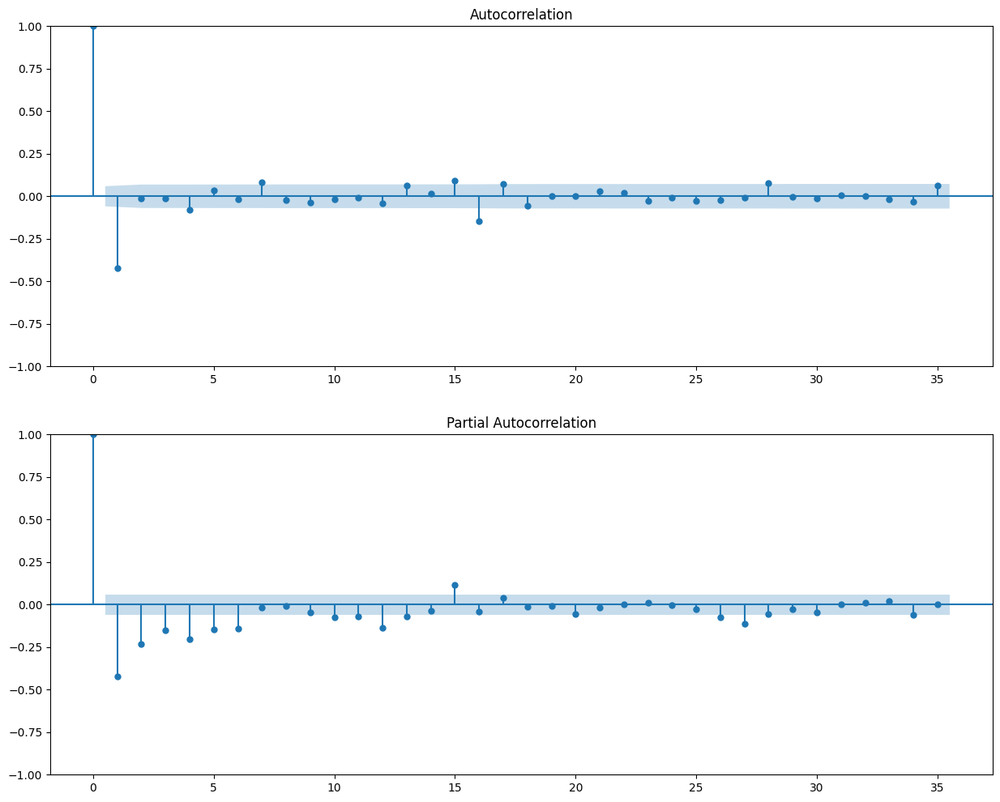

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 4, 7, 15, 16, 17, 28]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 10, 11, 12, 13, 15, 26, 27]


### Item 547

In [ ]:
item_id = "STORE_1_547"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
9728,STORE_1_547,604,21,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,0.2
9729,STORE_1_547,605,1,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,0.2
9730,STORE_1_547,606,20,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,0.2
9731,STORE_1_547,607,26,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,0.2
9732,STORE_1_547,608,45,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,0.2


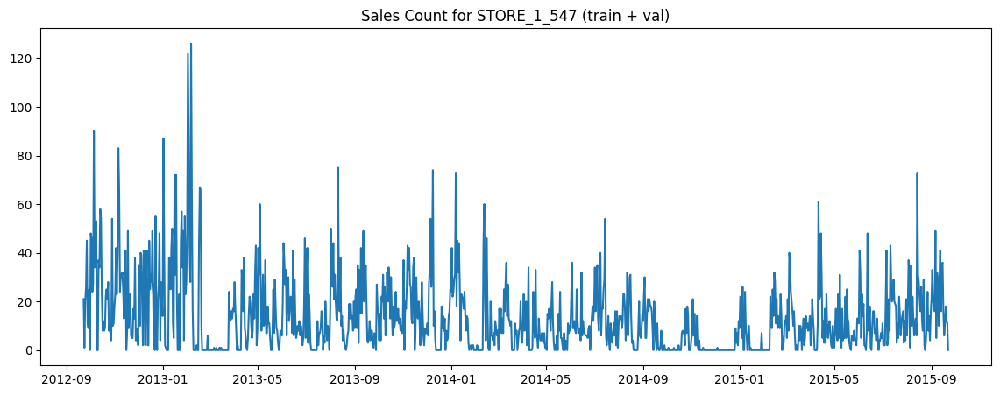

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

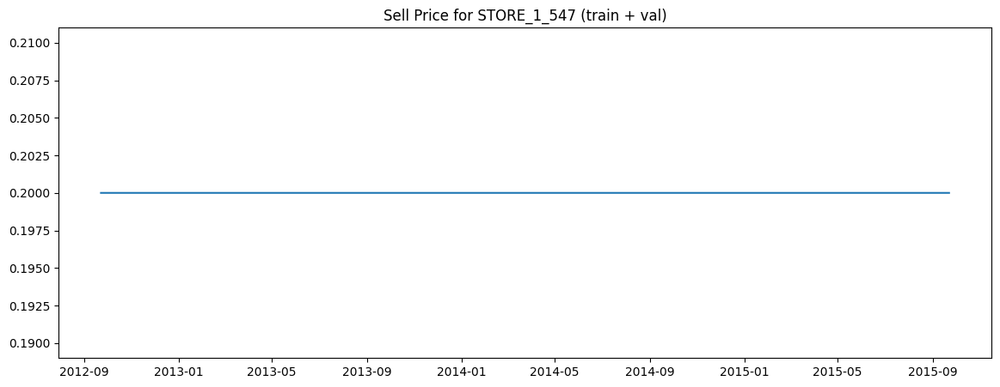

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

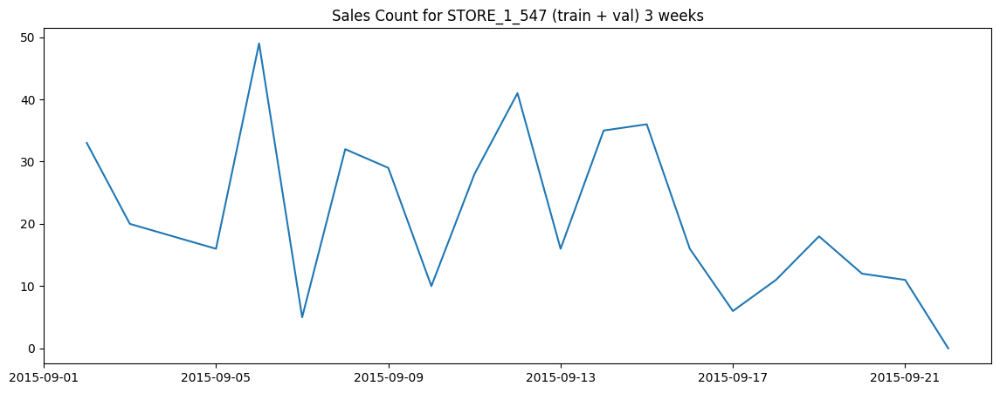

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

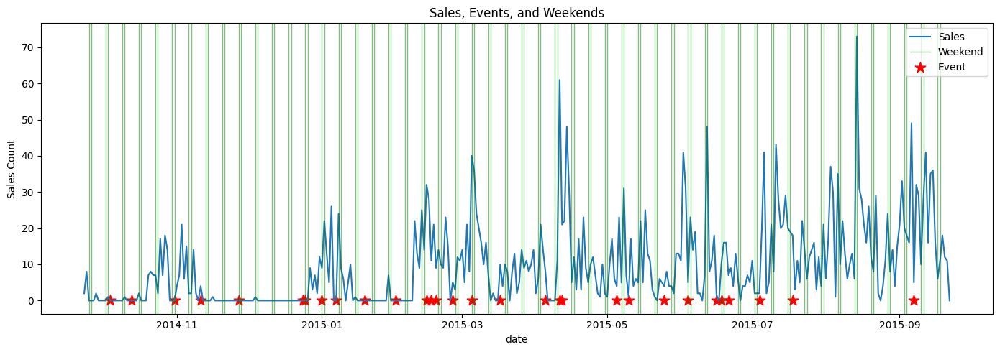

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

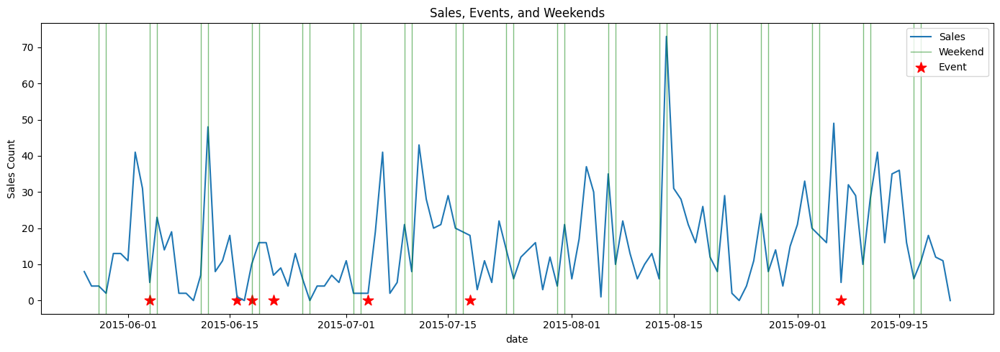

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд слабо восходящий.  
Сезонности не наблюдается.  
Корреляции с выходными/праздниками не наблюдается.

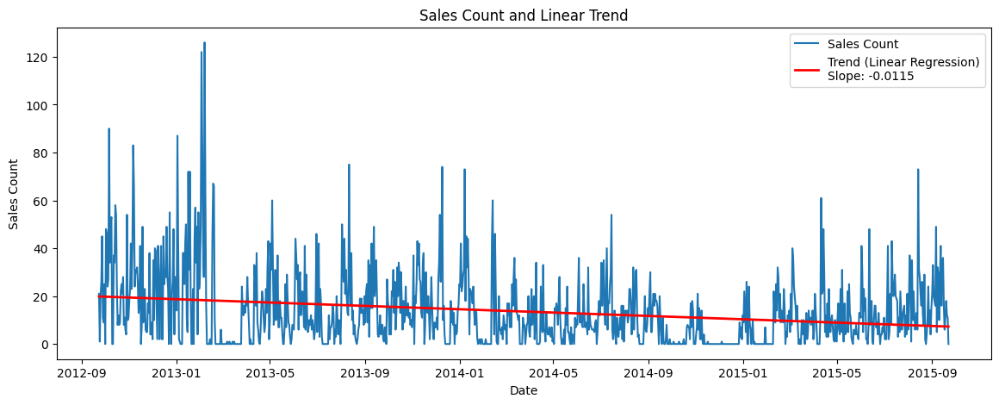

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 1.3176130144068685e-17})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


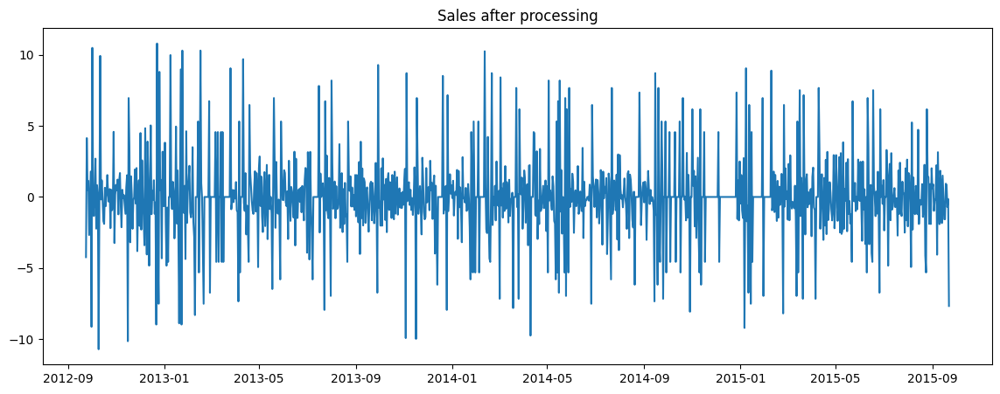

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 5.771236815201339e-19})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

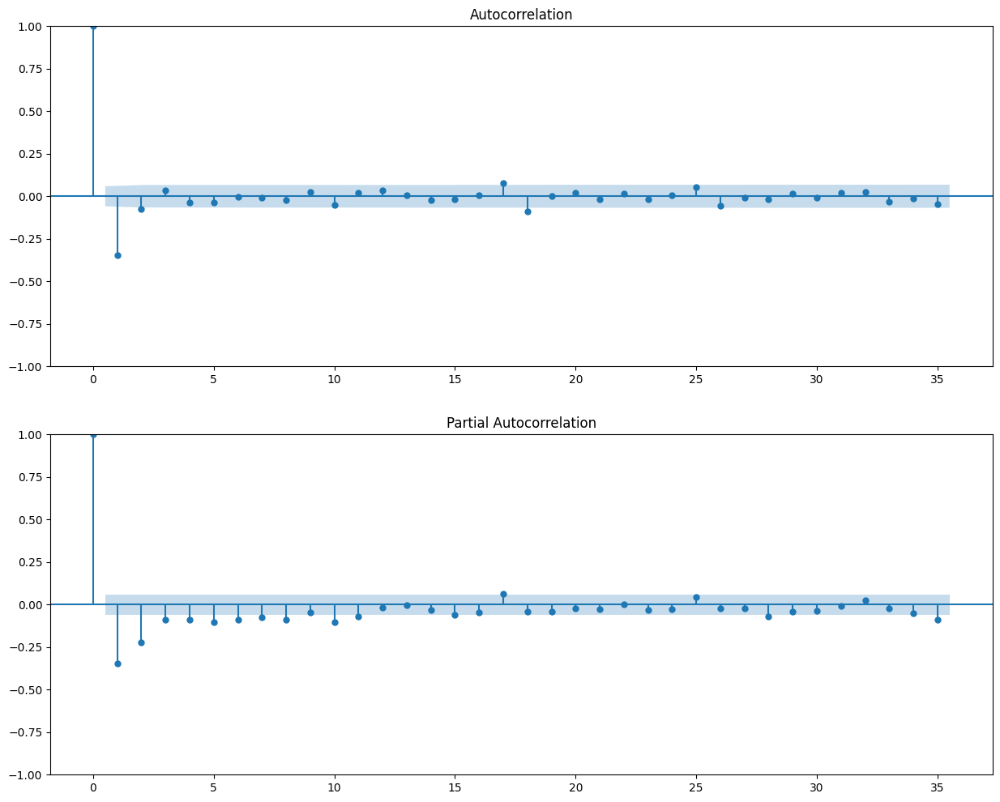

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 17, 18]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 15, 17, 28, 35]


### Item 555

In [ ]:
item_id = "STORE_1_555"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
10944,STORE_1_555,604,40,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.58
10945,STORE_1_555,605,32,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.58
10946,STORE_1_555,606,26,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.58
10947,STORE_1_555,607,23,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.58
10948,STORE_1_555,608,29,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.58


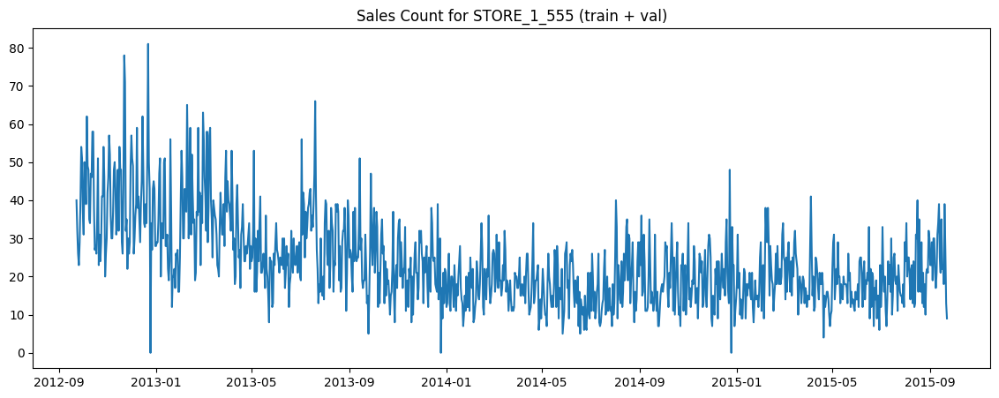

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

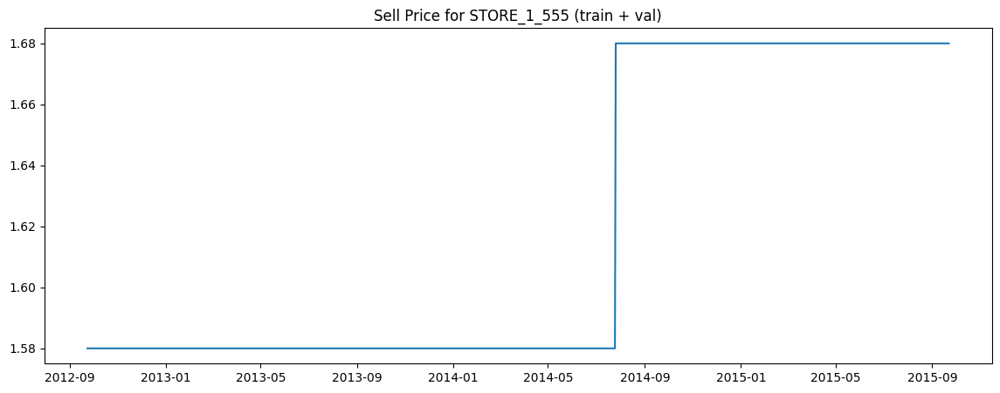

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

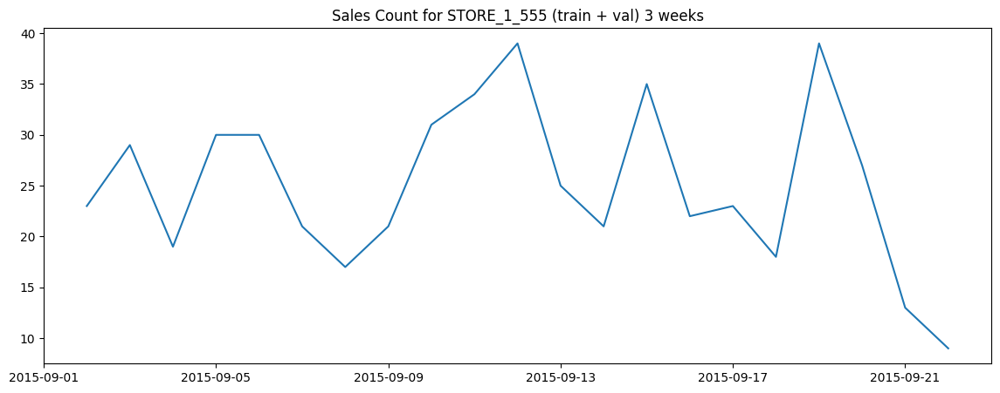

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

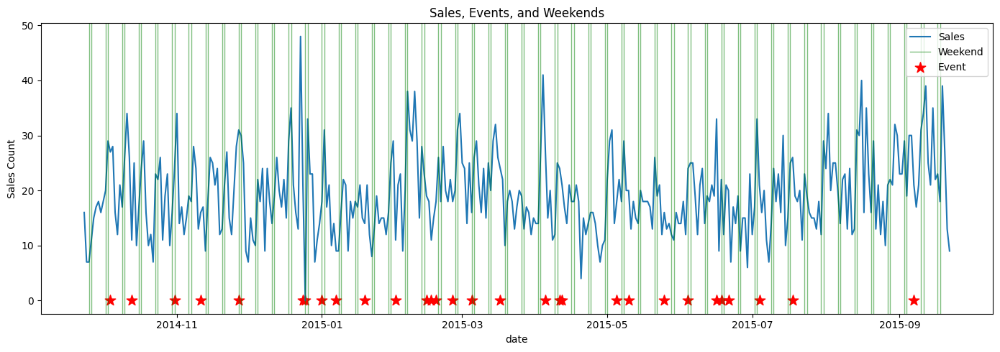

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

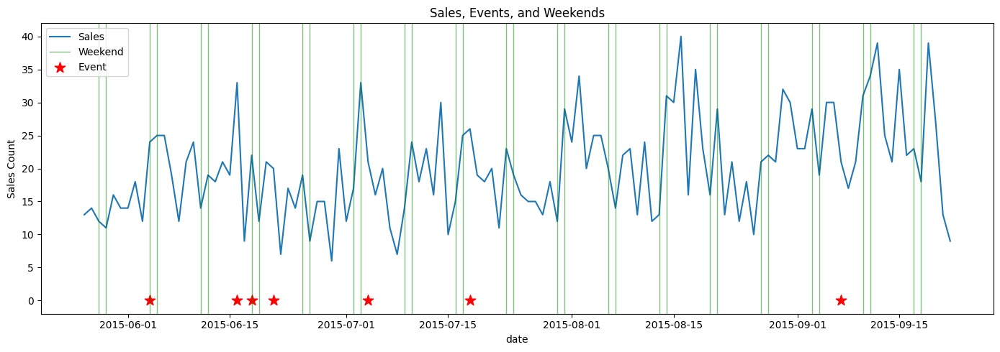

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.

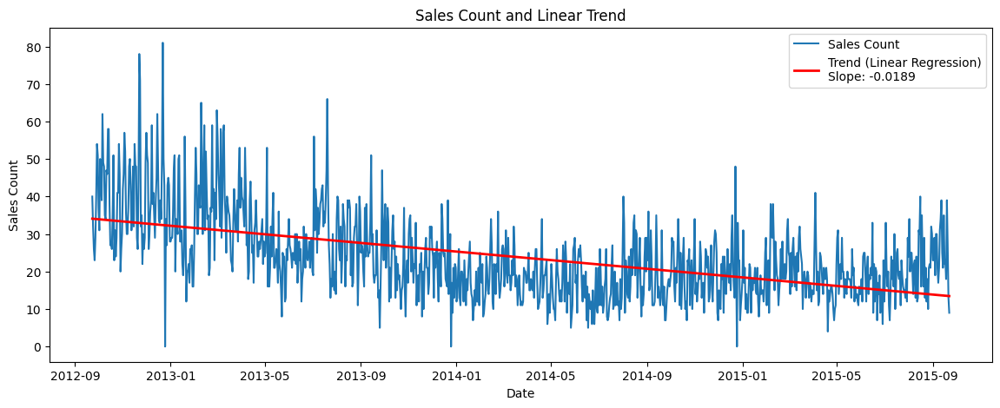

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.026612307012074732})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


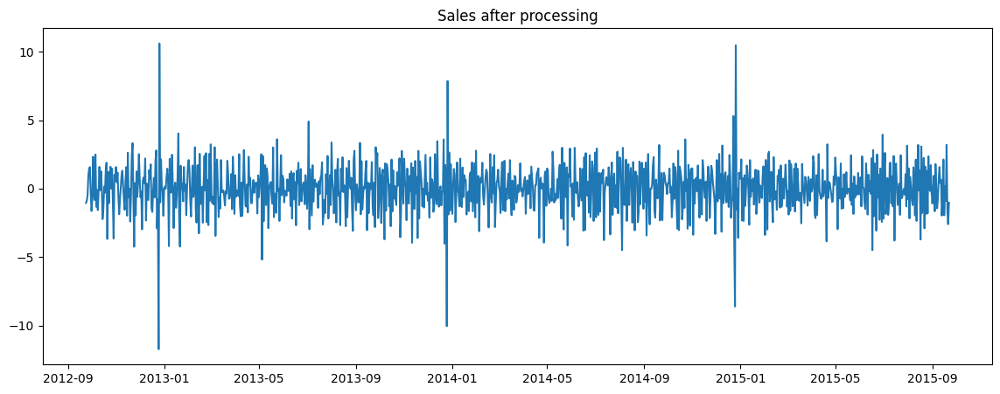

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 6.50623979906341e-19})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

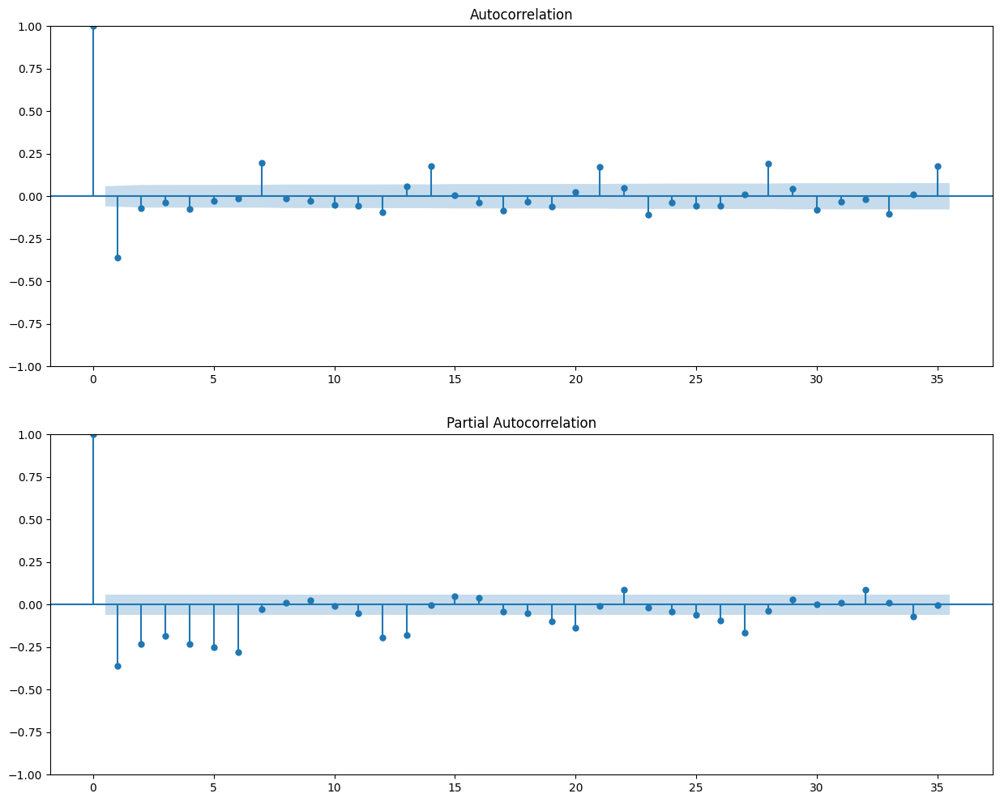

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 4, 7, 12, 14, 17, 21, 23, 28, 30, 33, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 12, 13, 19, 20, 22, 25, 26, 27, 32, 34]


### Item 584

In [ ]:
item_id = "STORE_1_584"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
12160,STORE_1_584,604,6,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.0
12161,STORE_1_584,605,0,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.0
12162,STORE_1_584,606,5,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.0
12163,STORE_1_584,607,1,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.0
12164,STORE_1_584,608,2,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.0


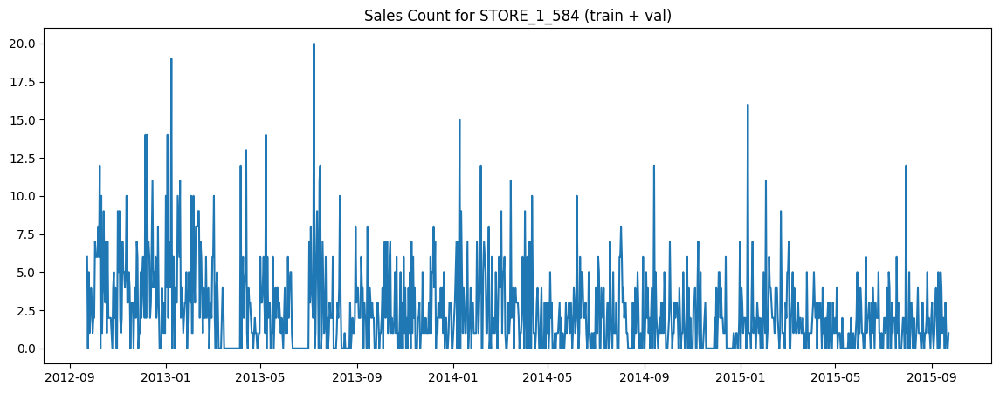

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

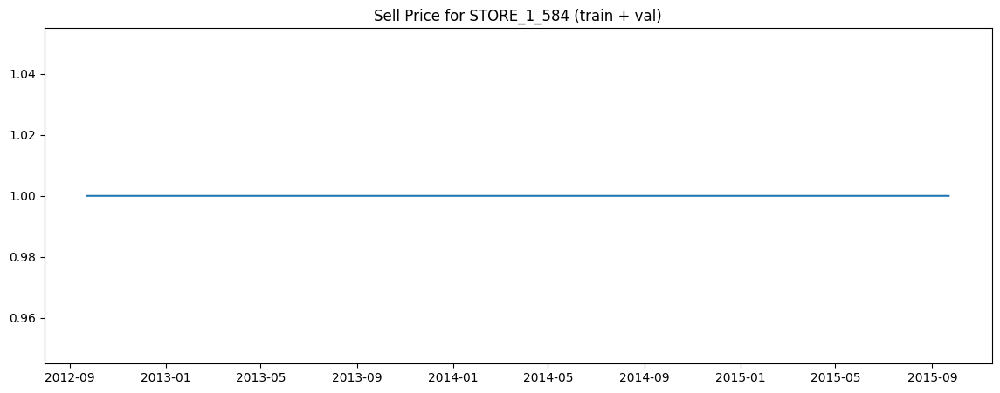

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

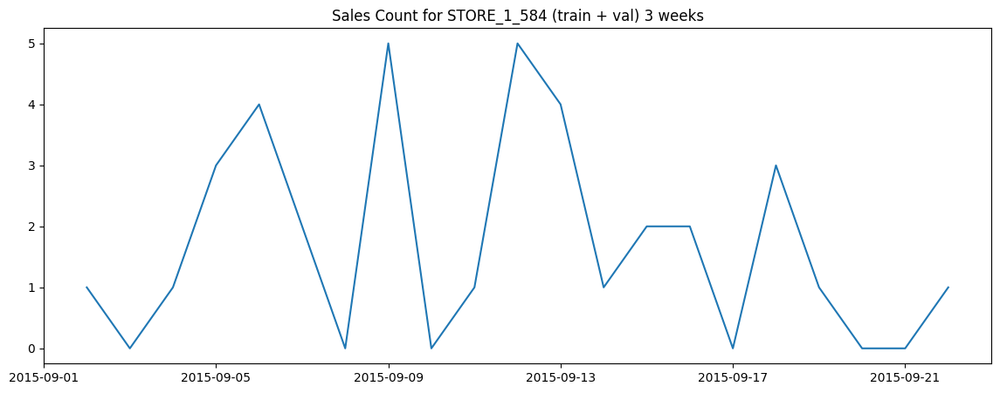

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

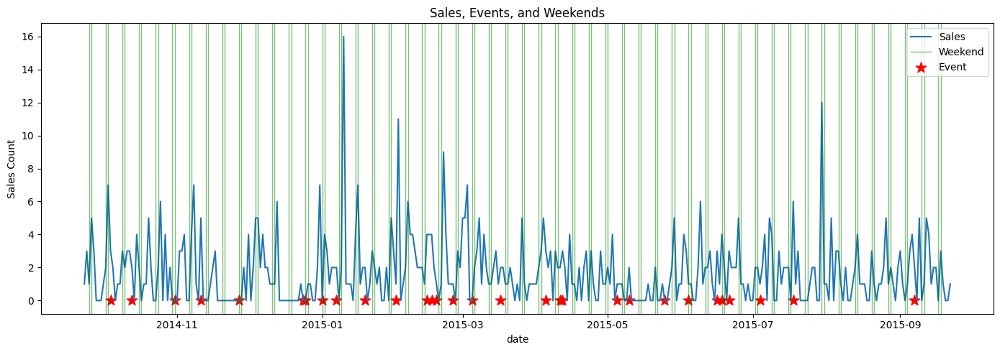

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

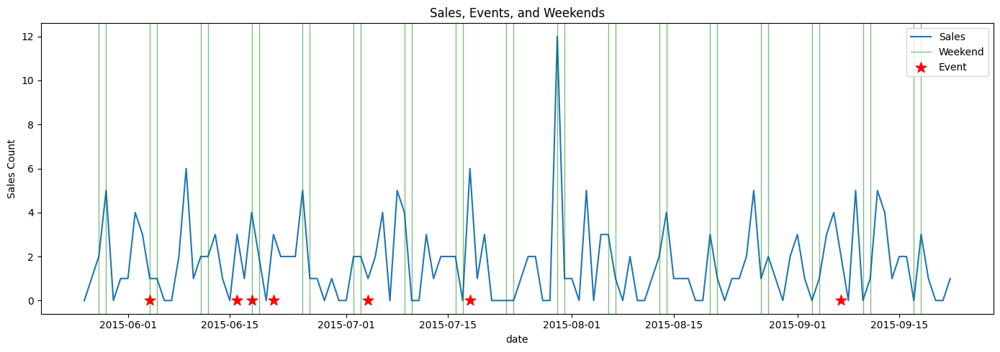

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый нисходящий тренд.  
Сезонность не наблюдаются.

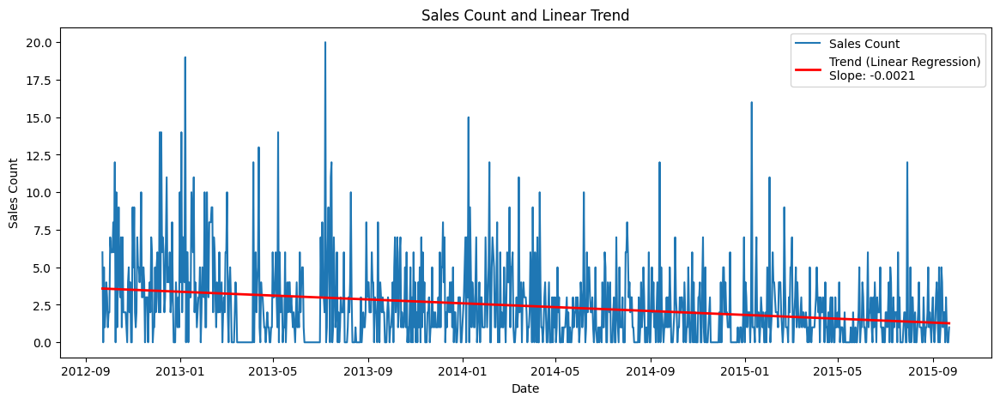

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 2.645518408092947e-12})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


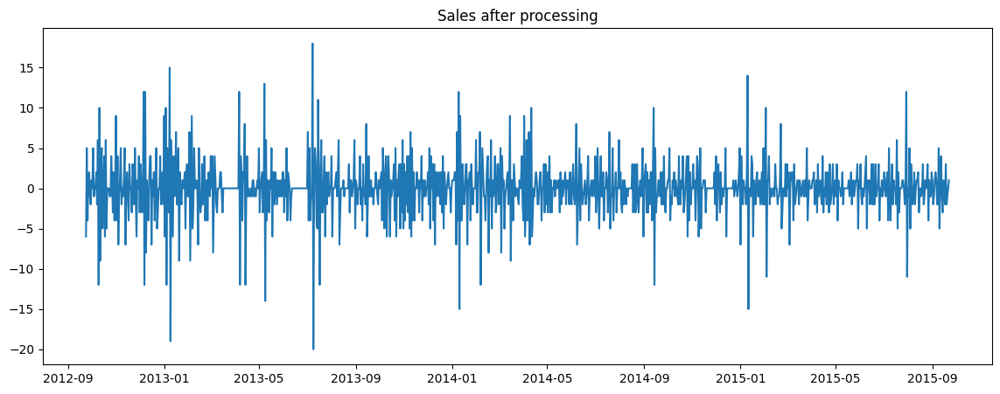

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.2679612934470281e-23})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

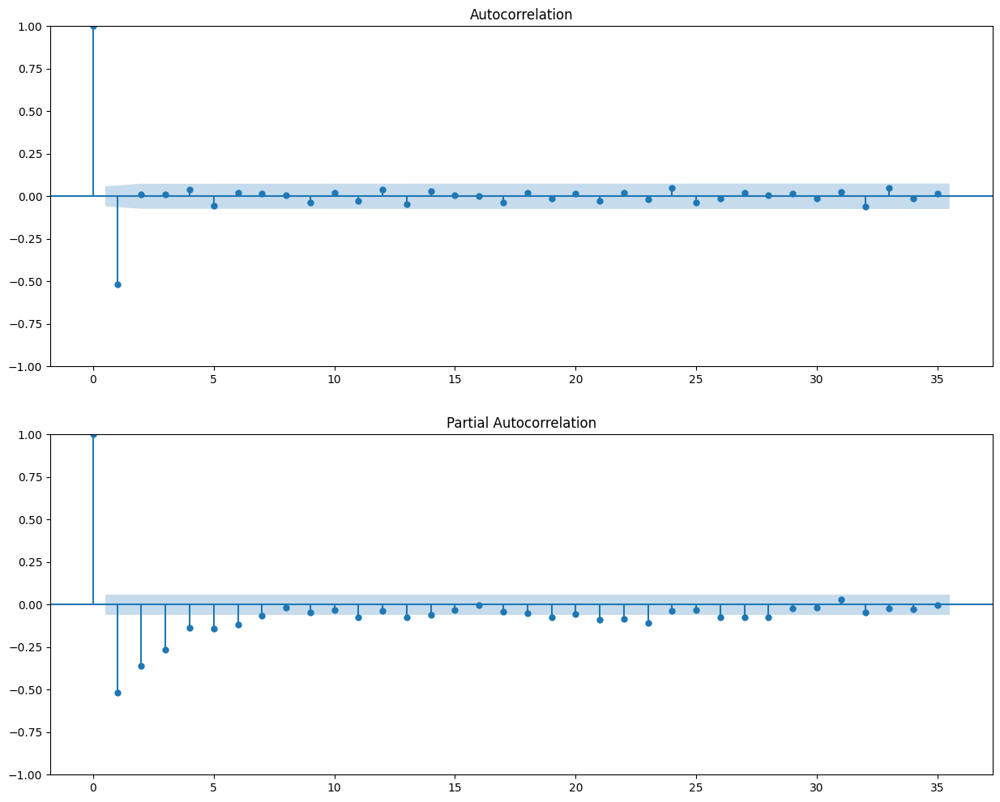

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 13, 19, 21, 22, 23, 26, 27, 28]


### Item 586

In [ ]:
item_id = "STORE_1_586"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
13376,STORE_1_586,604,64,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.58
13377,STORE_1_586,605,50,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.58
13378,STORE_1_586,606,44,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.58
13379,STORE_1_586,607,35,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.58
13380,STORE_1_586,608,40,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.58


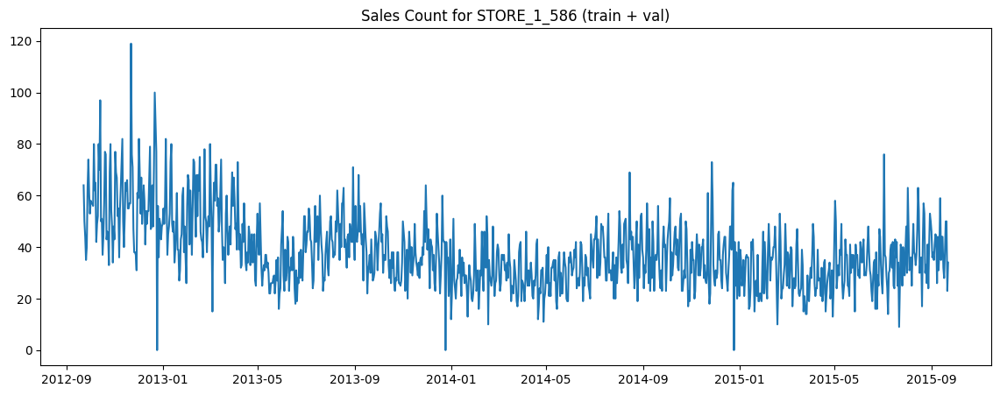

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

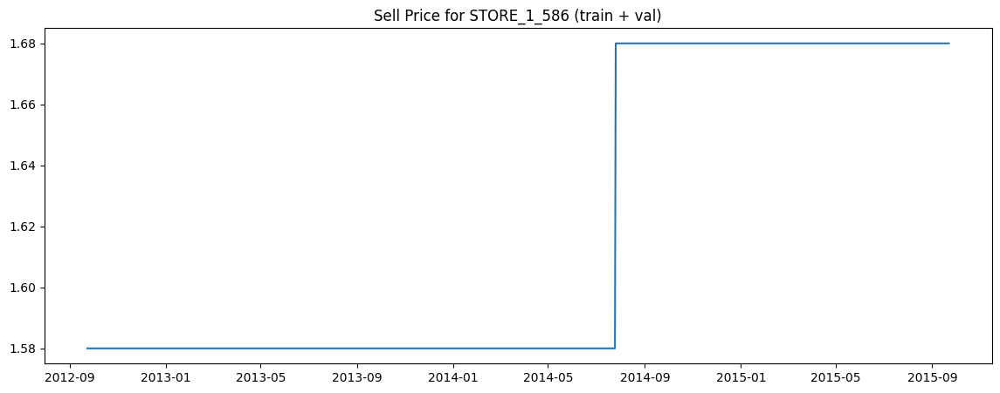

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

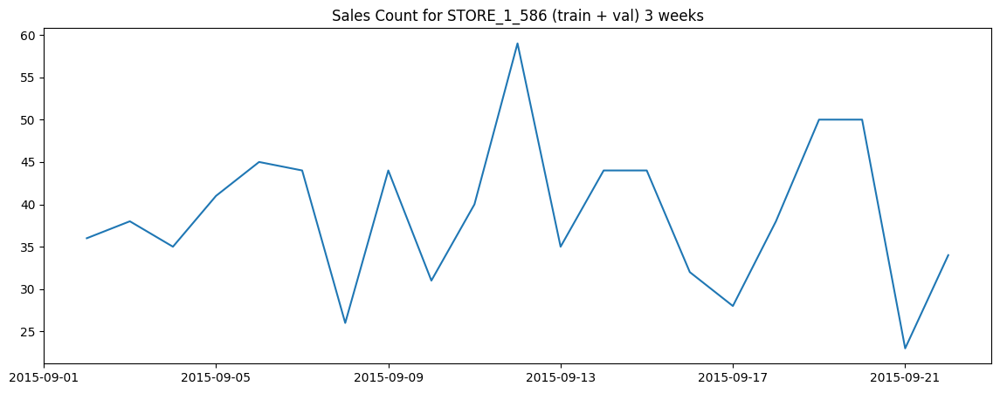

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

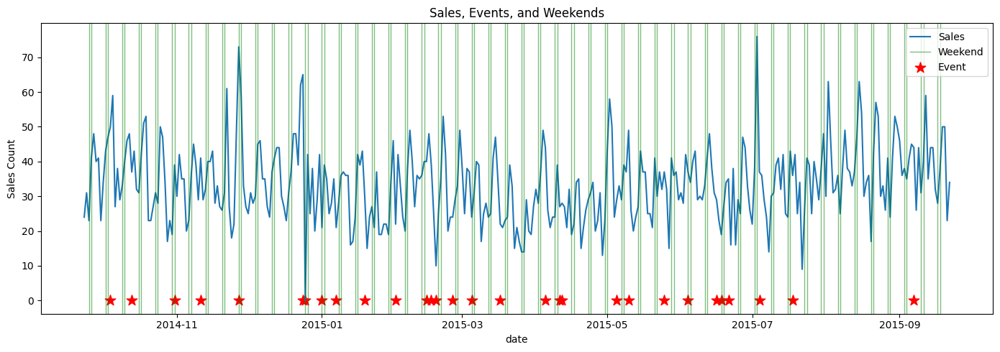

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

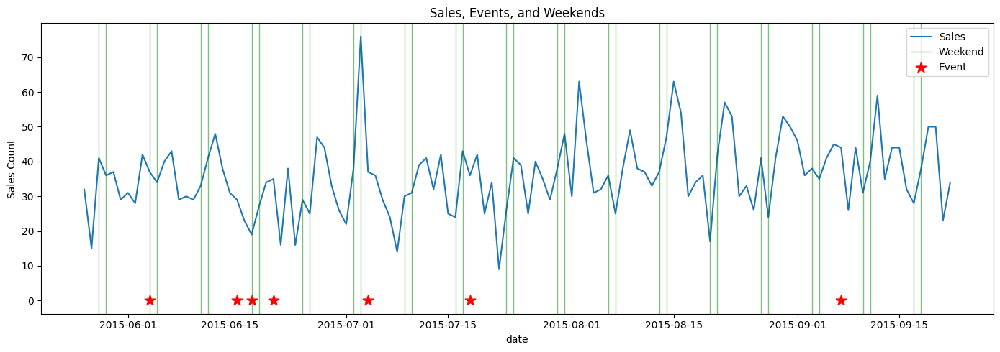

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый нисходящий тренд.  
Сезонность не наблюдаются.

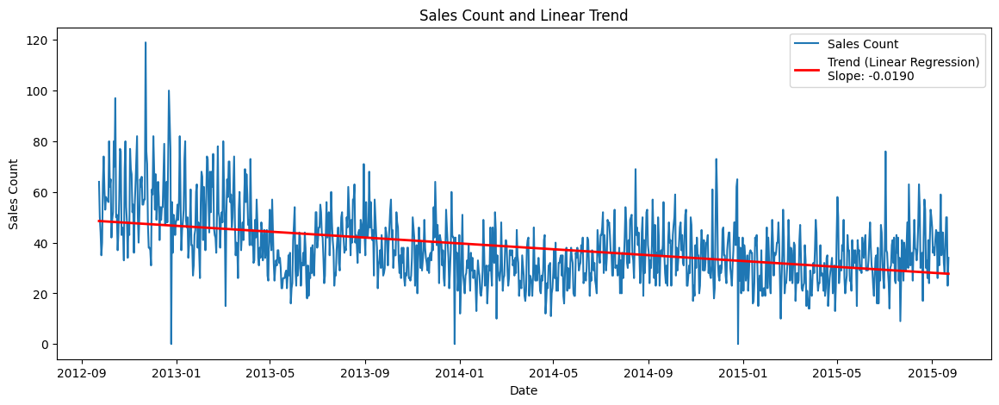

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.03683303501601962})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


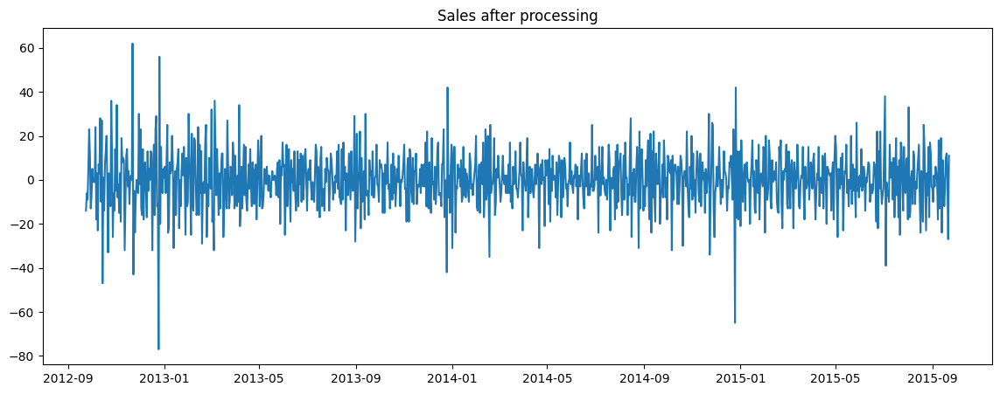

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 2.1022182276852121e-19})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

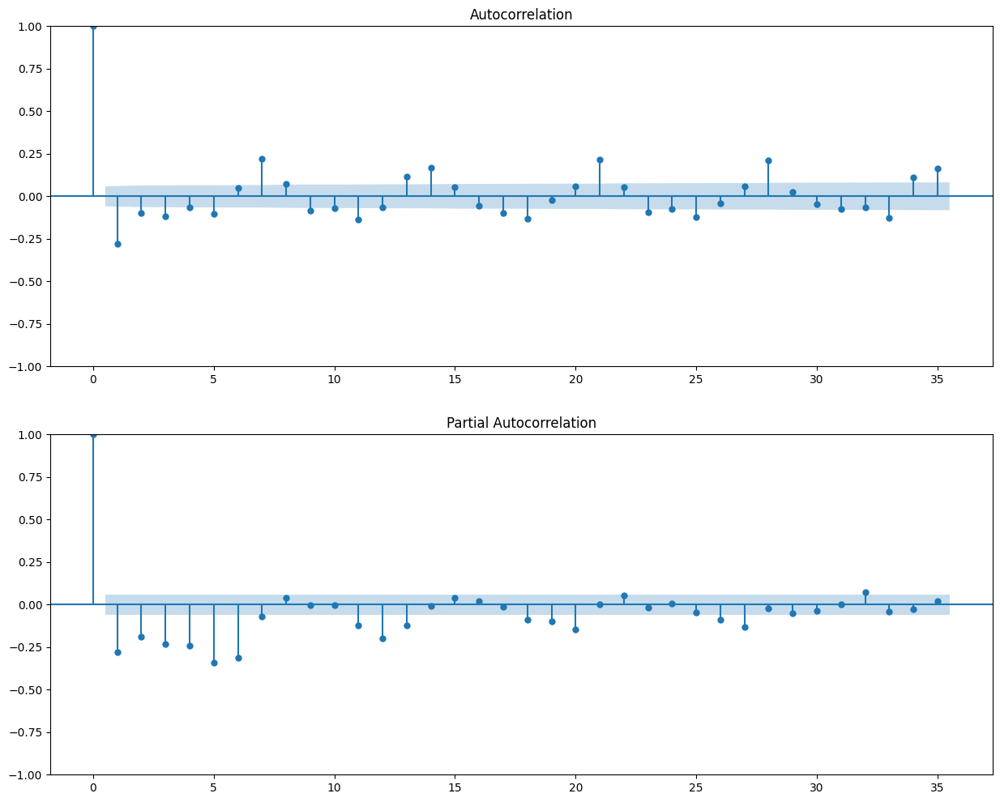

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 13, 14, 17, 18, 21, 23, 25, 28, 33, 34, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 12, 13, 18, 19, 20, 26, 27, 32]


### Item 587

In [ ]:
item_id = "STORE_1_587"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
14592,STORE_1_587,604,22,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,2.68
14593,STORE_1_587,605,26,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,2.68
14594,STORE_1_587,606,21,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,2.68
14595,STORE_1_587,607,21,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,2.68
14596,STORE_1_587,608,23,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,2.68


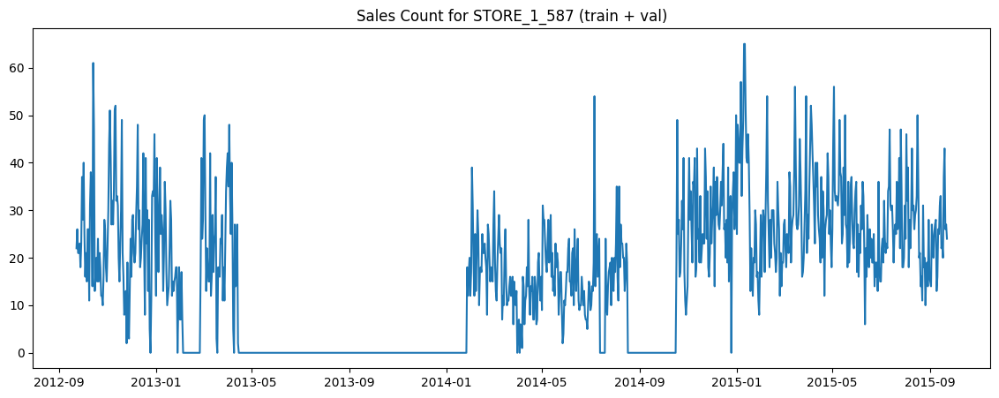

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

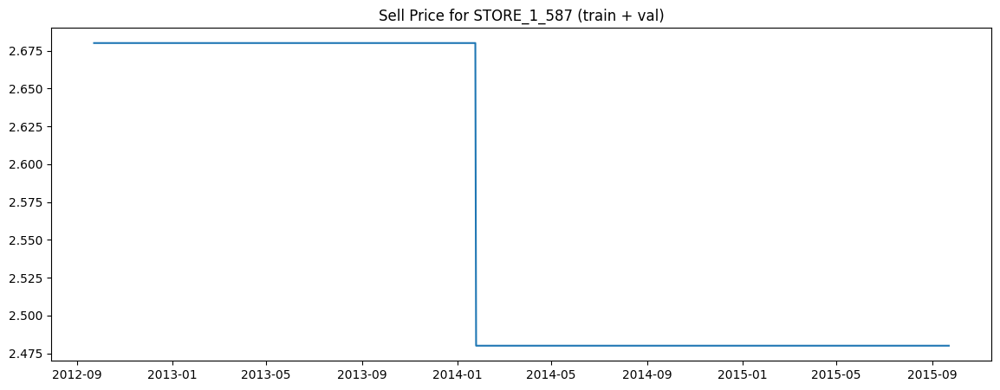

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

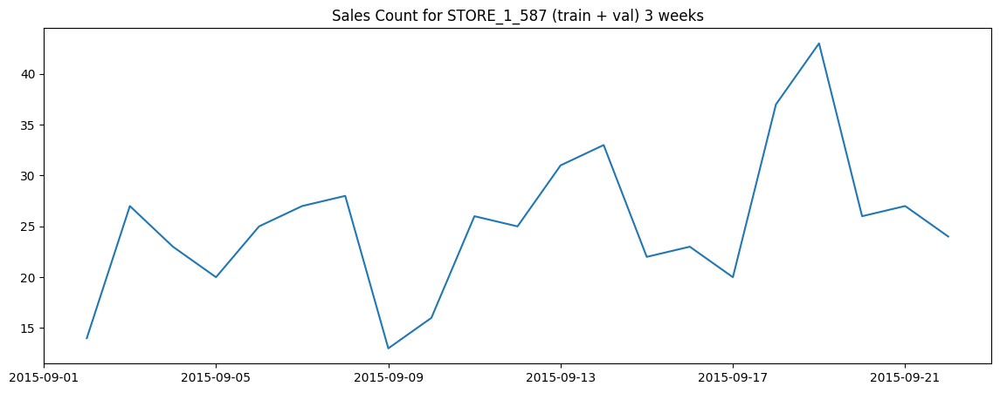

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

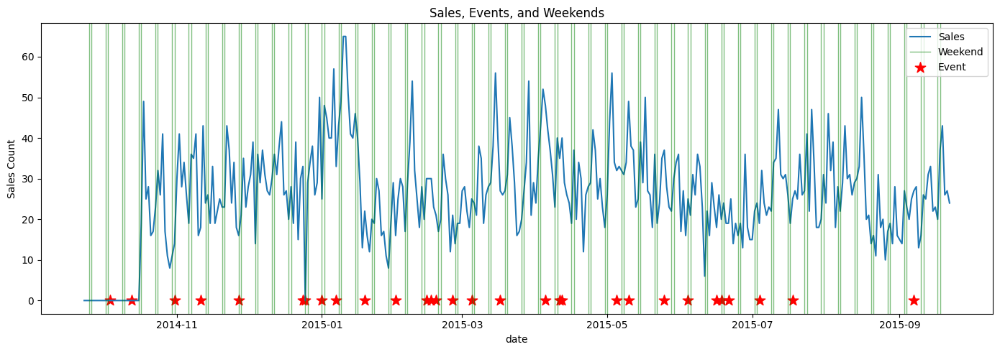

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

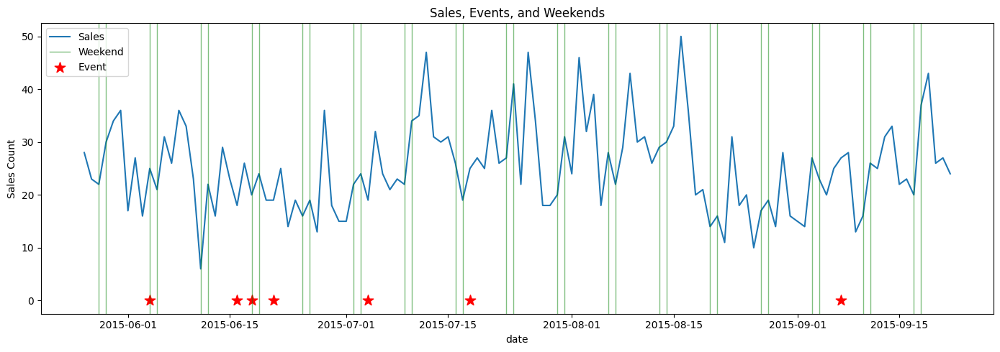

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый восходящий тренд.  
Недельная сезонность (пик = вторник).

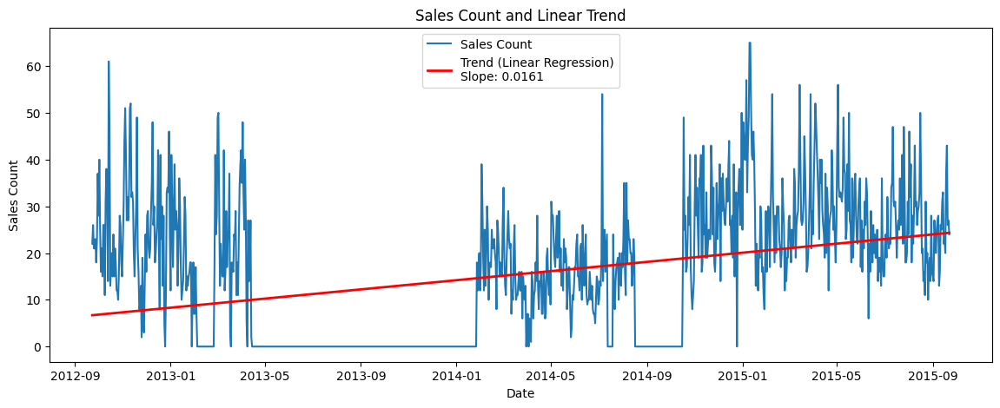

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.14735891192009487})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF принимаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка
* Дифференцирование "вычитанием" 7-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(7)

/tmp/ipykernel_111303/2061590246.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


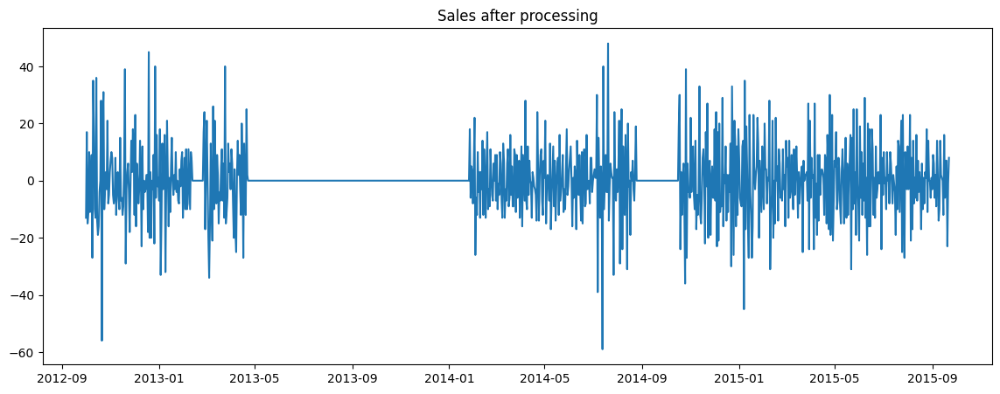

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 8.582903826441372e-23})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

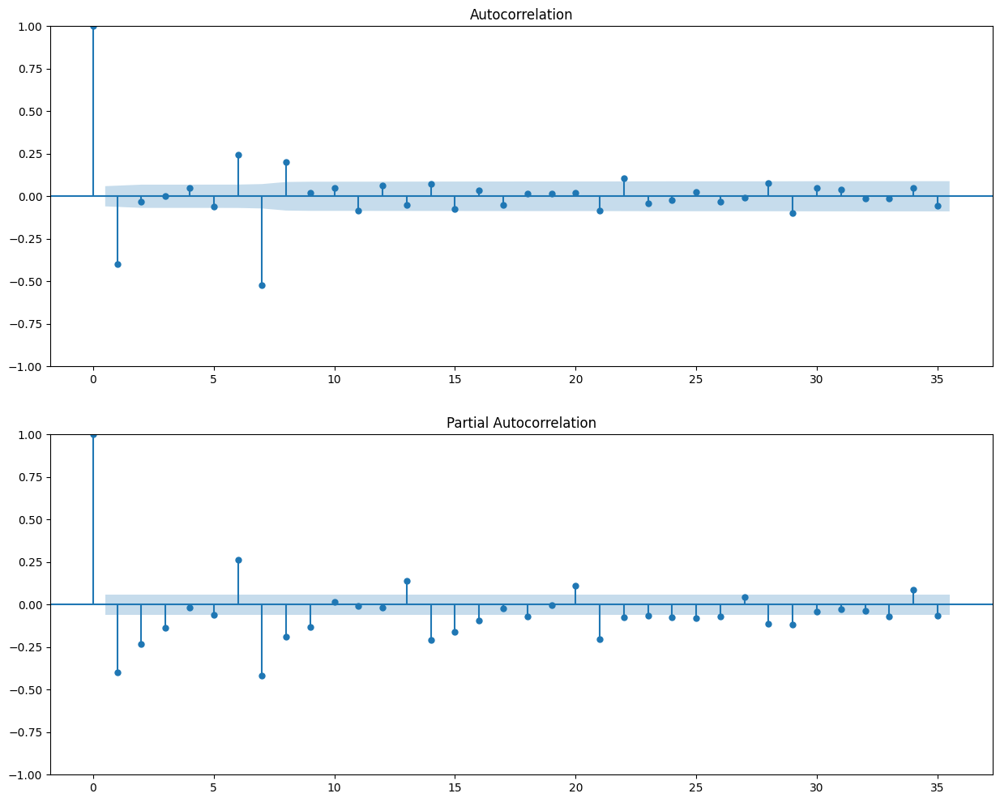

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 6, 7, 8, 22, 29]
Significant PACF lags: [0, 1, 2, 3, 6, 7, 8, 9, 13, 14, 15, 16, 18, 20, 21, 22, 23, 24, 25, 26, 28, 29, 33, 34, 35]


### Item 714

In [ ]:
item_id = "STORE_1_714"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
15808,STORE_1_714,604,31,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,1.48
15809,STORE_1_714,605,18,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,1.48
15810,STORE_1_714,606,31,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,1.48
15811,STORE_1_714,607,20,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,1.48
15812,STORE_1_714,608,22,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,1.48


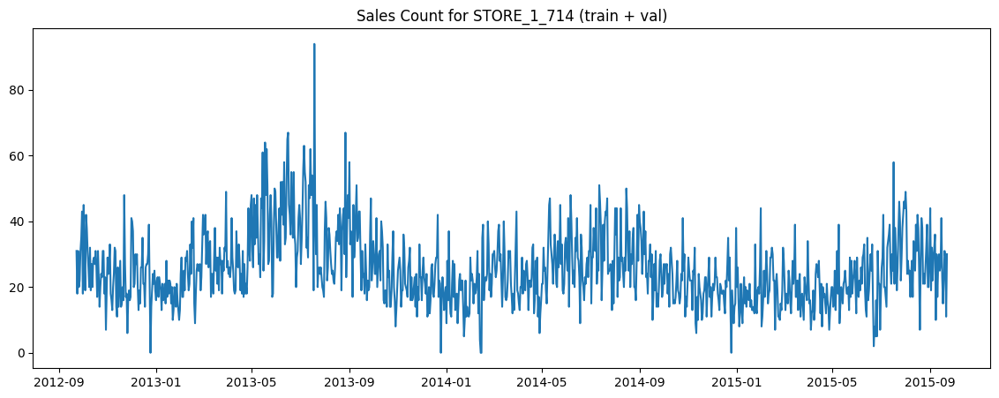

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

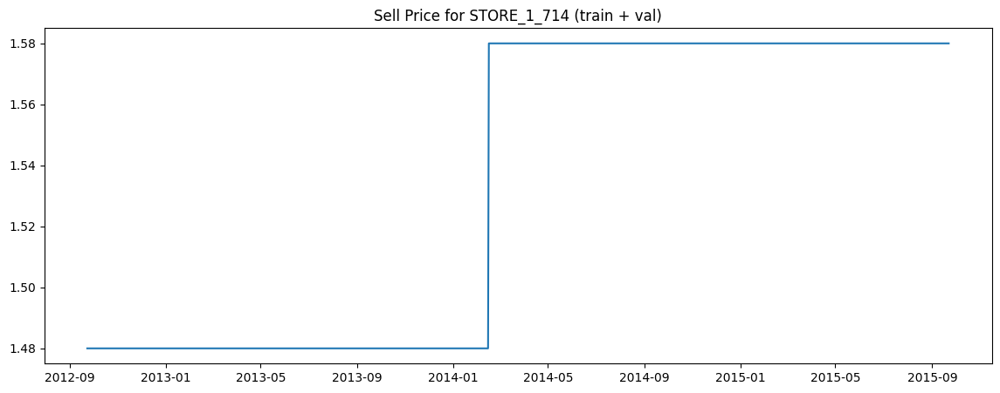

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

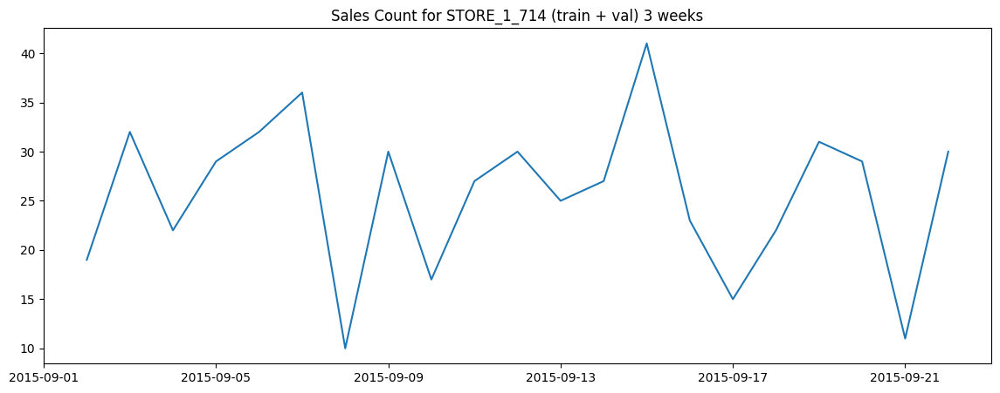

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-21:], item_data.cnt[-21:])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

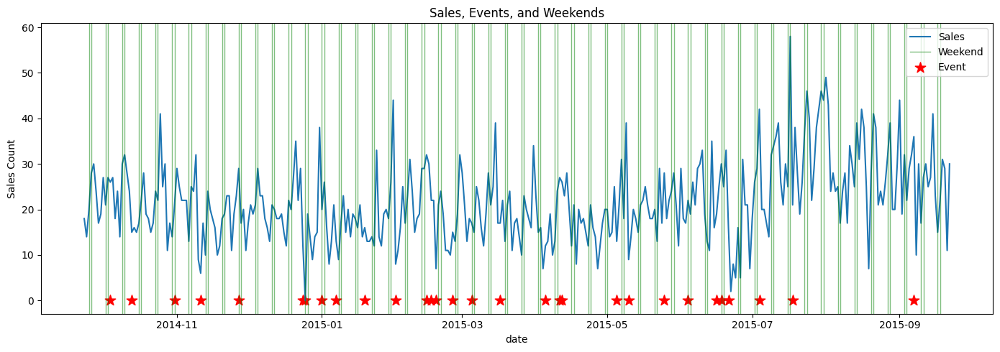

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

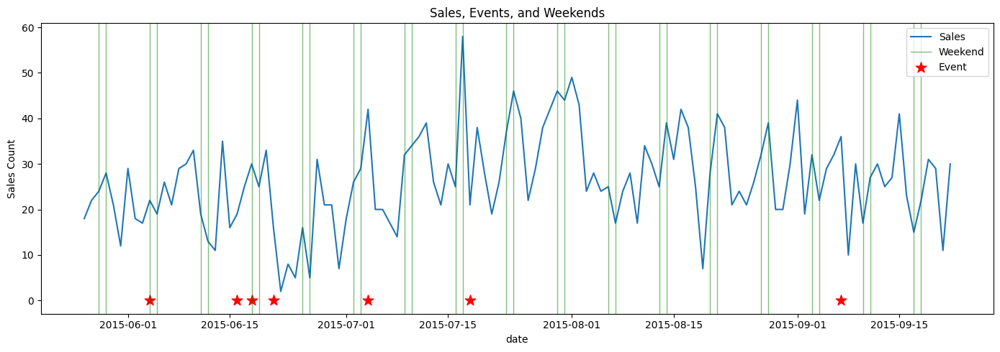

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд не наблюдается.  
Недельный цикл.  

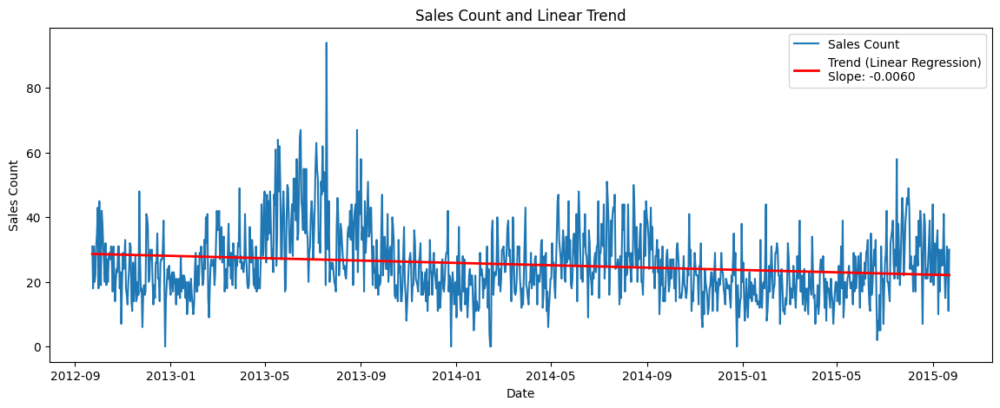

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.03738040201236203})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)

/tmp/ipykernel_111303/1491135785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = item_data.cnt - item_data.cnt.shift(1)


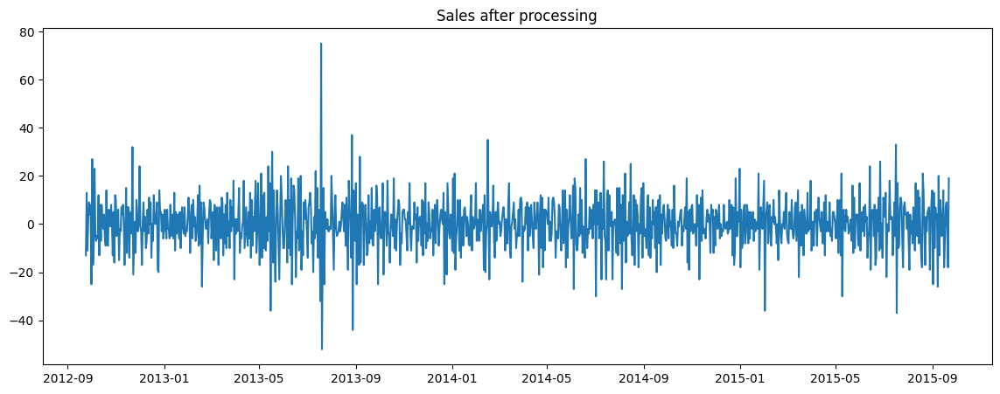

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 2.2863542741089613e-20})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

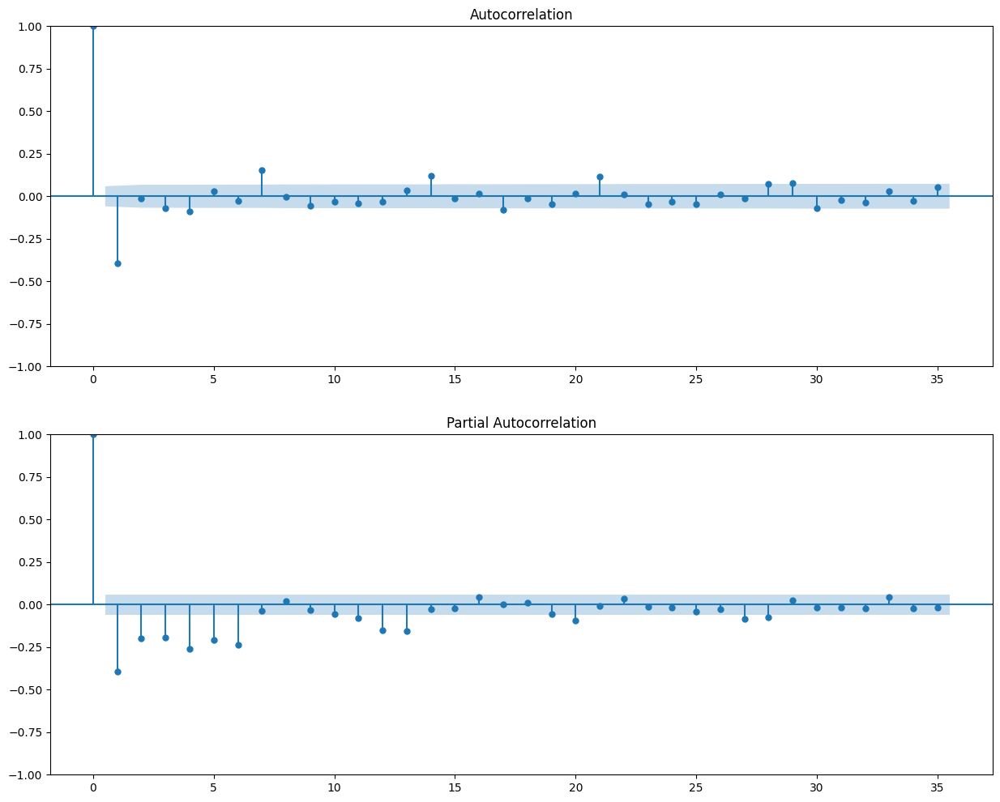

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 3, 4, 7, 14, 17, 21, 29]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 11, 12, 13, 20, 27, 28]


### Item 727

In [ ]:
item_id = "STORE_1_727"
item_data = sales_dates_prices[sales_dates_prices.item_id == item_id]
item_data.head()

,item_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,sell_price
17024,STORE_1_727,604,0,2012-09-23,11235,Sunday,2,9,2012,NaN,NaN,NaN,NaN,0,3.98
17025,STORE_1_727,605,2,2012-09-24,11235,Monday,3,9,2012,NaN,NaN,NaN,NaN,0,3.98
17026,STORE_1_727,606,5,2012-09-25,11235,Tuesday,4,9,2012,NaN,NaN,NaN,NaN,0,3.98
17027,STORE_1_727,607,2,2012-09-26,11235,Wednesday,5,9,2012,NaN,NaN,NaN,NaN,0,3.98
17028,STORE_1_727,608,0,2012-09-27,11235,Thursday,6,9,2012,NaN,NaN,NaN,NaN,0,3.98


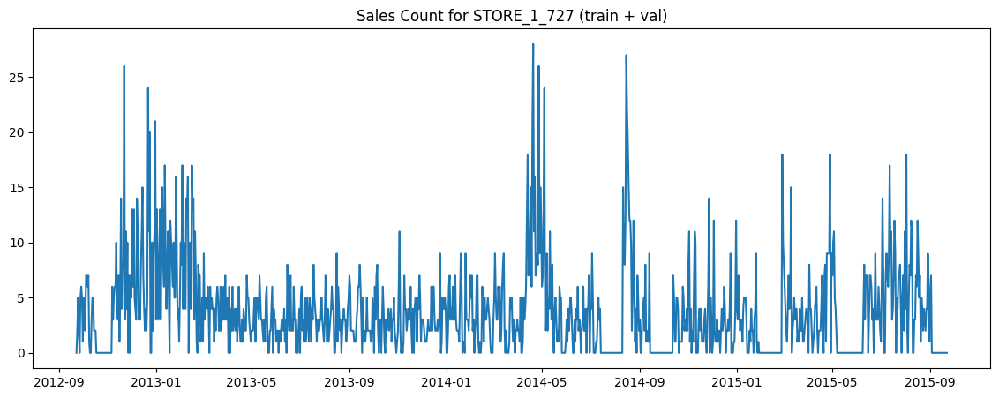

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt)
plt.title(f"Sales Count for {item_id} (train + val)")
plt.show()

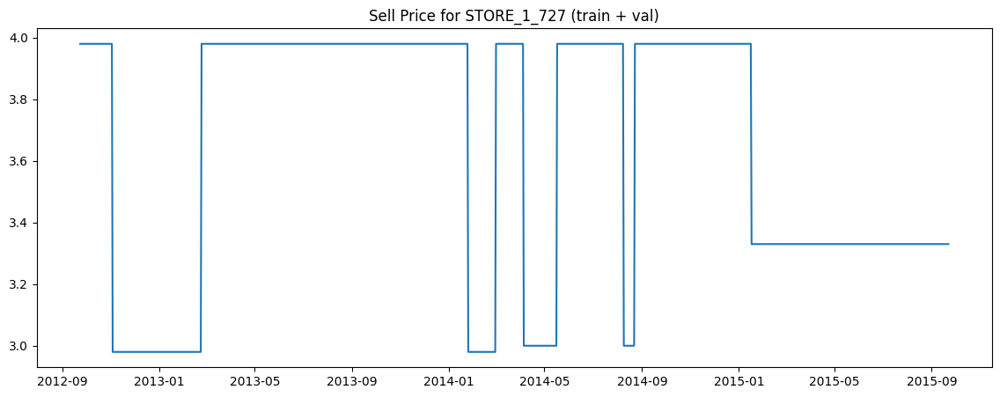

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.sell_price)
plt.title(f"Sell Price for {item_id} (train + val)")
plt.show()

Отчетливо наблюдаем повышение продаж при снижении цены.

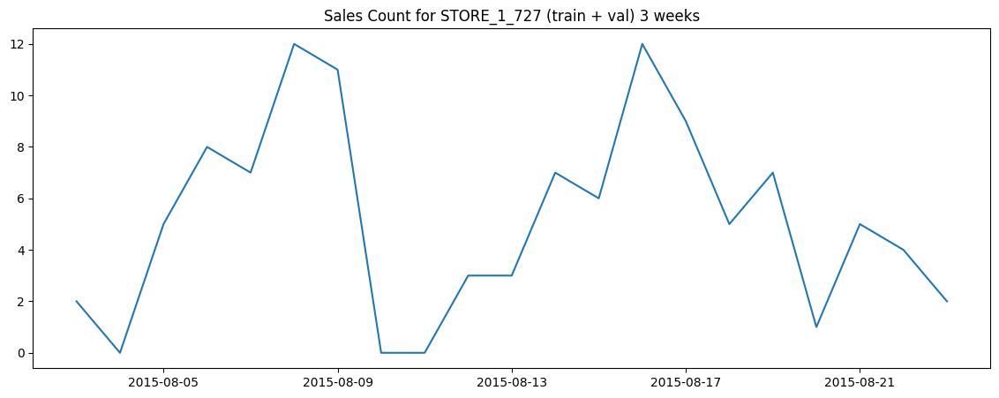

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date[-51:-30], item_data.cnt[-51:-30])
plt.title(f"Sales Count for {item_id} (train + val) 3 weeks")
plt.show()

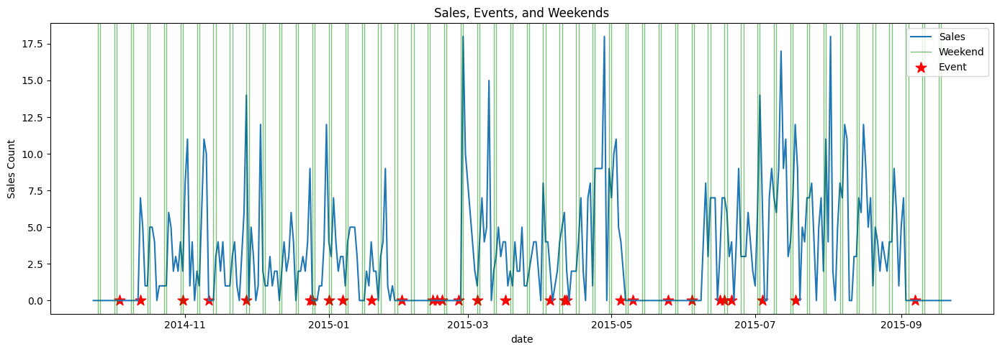

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

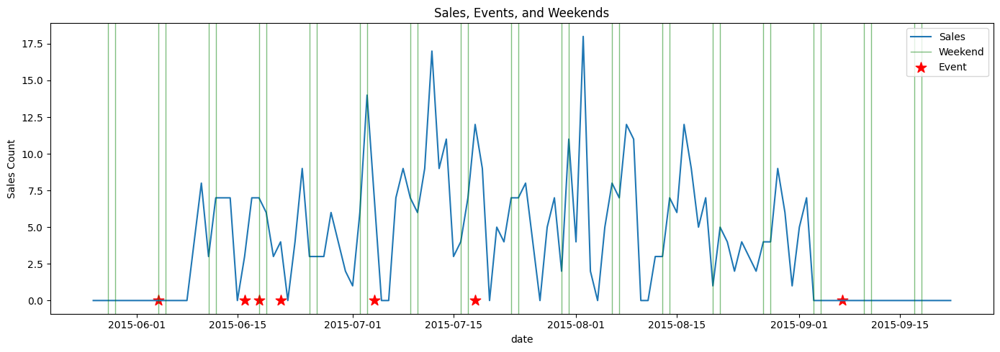

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренда/сезонности не наблюдаем.  

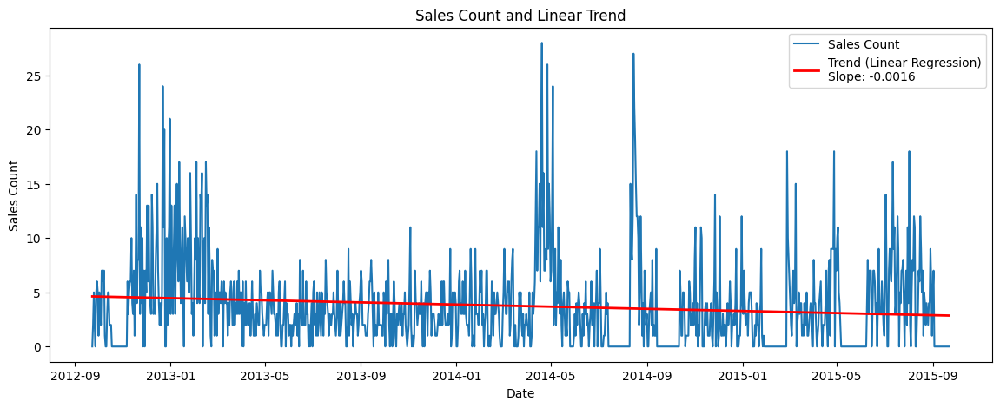

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.cnt)

(False, {'KPSS': 0.09117420757677719, 'ADF': 2.143055259447797e-05})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
boxcox_transformer = BoxCoxTransformer()
item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))
item_data.loc[:, "cnt_st"] = item_data.cnt_st - item_data.cnt_st.shift(1)

/tmp/ipykernel_111303/2685325293.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "cnt_st"] = boxcox_transformer.fit_transform(item_data.cnt.replace(0, 1e-6))


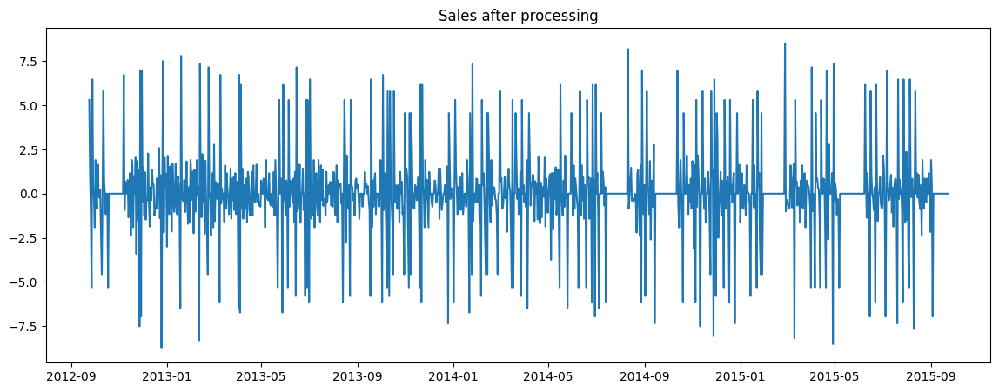

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date, item_data.cnt_st)
plt.title(f"Sales after processing")
plt.show()

In [ ]:
utils.test_trend(item_data.cnt_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 0.0})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

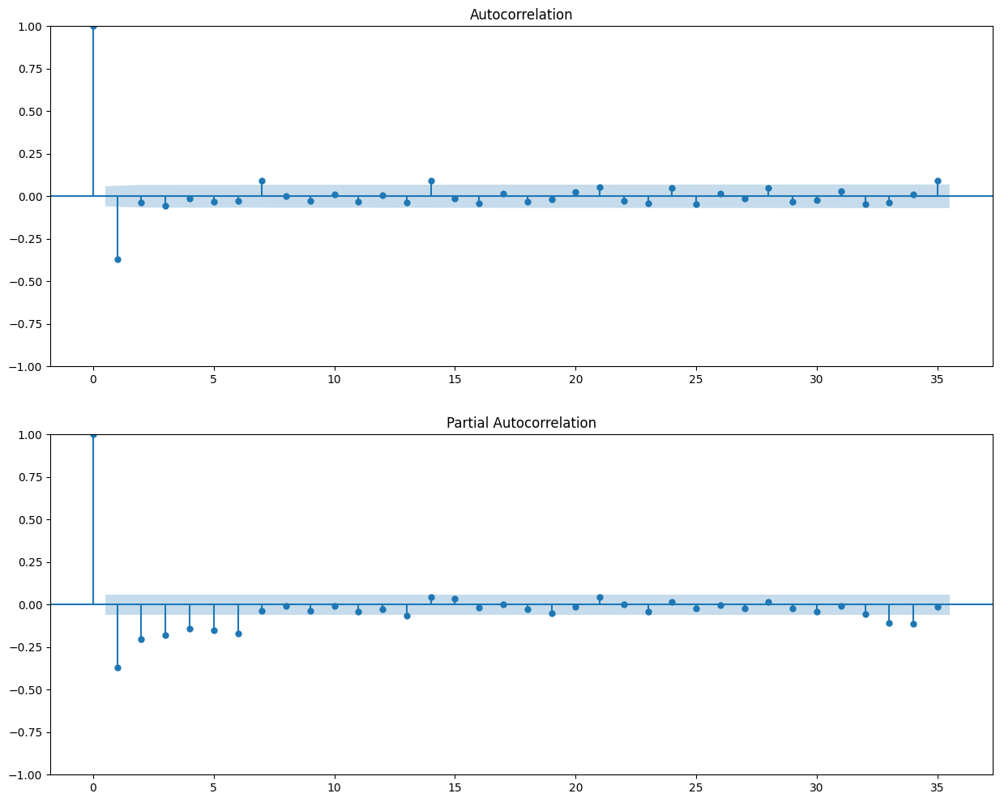

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.cnt_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.cnt_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.cnt_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 7, 14, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 13, 33, 34]
